In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split,RandomizedSearchCV,cross_val_score,GridSearchCV,cross_validate
import sklearn.metrics as metrics 
import matplotlib.cm as cm

# algorithms
import xgboost as xgb
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# data preprocessing
from sklearn.preprocessing import OneHotEncoder, StandardScaler,OrdinalEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.model_selection import RandomizedSearchCV

import warnings
warnings.filterwarnings("ignore")

# metrics
from sklearn.metrics import mean_squared_error, r2_score ,explained_variance_score


In [2]:
df_ = pd.read_excel("/Users/zaferavci/Documents/GitHub/Miuul-CaseStudy-1/Miuul-Case-Study/oppurtunity.xlsx", header=0) 

In [3]:
df = df_

In [4]:
df.columns = [col.lower() for col in df.columns]

In [5]:
df.head()

,opp. id,contactid,recordtype.name,account.name,amount,platform__c,closedate,donation_date__c,stagename,campaign.name
0,0065G00000WOEXGQA5,NaN,Expansion Income,`3613,200.0,NaN,2020-10-22,NaT,Awarded,NaN
1,0065G00000WOEdEQAX,003f400000GtceBAAR,Silent Auction Purchase,`5059,2550.0,NaN,2020-06-30,NaT,Closed Won,2020 EWC
2,0065G00000WOEf0QAH,003f400001IklhmAAB,Donation,`0211,50.0,Facebook,2020-10-12,NaT,Closed Won,NaN
3,0065G00000WOEf1QAH,0035G00001aanl2QAA,Donation,`0219,80.0,Facebook,2020-10-16,NaT,Closed Won,NaN
4,0065G00000WOEf2QAH,0035G00001aanl3QAA,Donation,`0277,10.0,Facebook,2020-10-15,NaT,Closed Won,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16000 entries, 0 to 15999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   opp. id           16000 non-null  object        
 1   contactid         15069 non-null  object        
 2   recordtype.name   16000 non-null  object        
 3   account.name      15996 non-null  object        
 4   amount            15618 non-null  float64       
 5   platform__c       13849 non-null  object        
 6   closedate         16000 non-null  datetime64[ns]
 7   donation_date__c  7557 non-null   datetime64[ns]
 8   stagename         16000 non-null  object        
 9   campaign.name     12503 non-null  object        
dtypes: datetime64[ns](2), float64(1), object(7)
memory usage: 1.2+ MB


In [7]:
df.describe([0.05,0.1,0.5,0.75,0.90,0.95,0.99]).T

,count,mean,min,5%,10%,50%,75%,90%,95%,99%,max,std
amount,15618.0,599.650734,0.0,10.0,20.0,50.0,105.0,750.0,1500.0,10266.7371,550000.0,5621.051114
closedate,16000,2022-10-06 08:17:09.599999744,2017-01-23 00:00:00,2018-04-26 00:00:00,2020-05-28 09:36:00.000001280,2023-03-08 00:00:00,2024-01-17 06:00:00,2024-09-23 00:00:00,2024-12-17 00:00:00,2025-07-01 00:00:00,2026-03-20 00:00:00,NaN
donation_date__c,7557,2024-01-19 05:37:28.034934528,2021-04-19 00:00:00,2023-03-03 00:00:00,2023-04-13 00:00:00,2023-12-18 00:00:00,2024-08-14 00:00:00,2024-11-14 00:00:00,2024-12-18 00:00:00,2025-03-04 00:00:00,2025-03-13 00:00:00,NaN


In [8]:
df.describe(include='O').T   #df.describe(include='all').T  tüm verileri ayni tabloda incelemek icin..

,count,unique,top,freq
opp. id,16000,16000,0065G00000WOEXGQA5,1
contactid,15069,8200,003f400000FhJtbAAF,100
recordtype.name,16000,7,Donation,15296
account.name,15996,5514,`4244,100
platform__c,13849,26,Qgiv,3914
stagename,16000,14,Closed Won,14756
campaign.name,12503,166,2023 EKC,749


In [9]:
df.isnull().sum()

opp. id                0
contactid            931
recordtype.name        0
account.name           4
amount               382
platform__c         2151
closedate              0
donation_date__c    8443
stagename              0
campaign.name       3497
dtype: int64

In [10]:
# Eksik değerlerin sayısı ve yüzdesi
missing_df = df.isnull().sum().to_frame(name='Missing Count')
missing_df['Missing Ratio (%)'] = 100 * missing_df['Missing Count'] / len(df)
missing_df = missing_df[missing_df['Missing Count'] > 0].sort_values('Missing Count', ascending=False)


In [11]:
missing_df

,Missing Count,Missing Ratio (%)
donation_date__c,8443,52.76875
campaign.name,3497,21.85625
platform__c,2151,13.44375
contactid,931,5.81875
amount,382,2.38750
account.name,4,0.02500


Missing Valueların Doldurulması

In [12]:
# 1. 'donation_date__c' kolonunu tamamen sil
df.drop(columns=['donation_date__c'], inplace=True)

In [13]:
# 2. 'campaign.name' eksiklerini 'No campaign' ile doldur
df['campaign.name'] = df['campaign.name'].fillna('No campaign')

In [14]:
df['amount'].sum()

np.float64(9365345.17)

In [15]:
# 3. 'contactid' ve 'account.name' boş olan satırları sil
df.dropna(subset=['contactid', 'account.name'], inplace=True)

In [16]:
df['amount'].sum()

np.float64(4216587.09)

In [17]:
# 4. 'amount' eksiklerini medyan ile doldur
df['amount'] = df['amount'].fillna(df['amount'].median())

In [18]:
df['amount'].sum()

np.float64(4233937.09)

Platform_c nin Campaign name ilişkisine göre koşullu mod ile doldurulması

In [19]:
# Adım 1: Kırılma noktasını düzeltiyoruz – to_frame'e özel isim veriyoruz
campaign_platform_ratio = (
    df[df['platform__c'].notnull()]
    .groupby(['campaign.name', 'platform__c'])
    .size()
    .reset_index(name='count')  # Bu artık tekrar etmeyen isim olacak
)

# Adım 2: Toplam kampanya sayısına göre oranları hesapla
total_counts = campaign_platform_ratio.groupby('campaign.name')['count'].transform('sum')
campaign_platform_ratio['ratio'] = campaign_platform_ratio['count'] / total_counts

In [20]:
campaign_platform_ratio

,campaign.name,platform__c,count,ratio
0,10 for 10,Facebook,64,1.000000
1,2019 EWC,CTK Website,2,0.666667
2,2019 EWC,Check,1,0.333333
3,2019 Summer Event,Check,1,1.000000
4,2020 EWC,Give Lively,4,0.800000
...,...,...,...,...
402,United Way,Check,5,0.065789
403,United Way,Truist,63,0.828947
404,United Way,United Way,8,0.105263
405,Welliver Memorial 2020,CTK Website,4,0.190476


In [21]:
# %90 üzeri eşleşmeleri al  
strong_matches = campaign_platform_ratio[campaign_platform_ratio['ratio'] >= 0.9]

# Sözlük oluştur: {'Campaign.Name': 'Platform__c'}
campaign_to_platform = dict(zip(strong_matches['campaign.name'], strong_matches['platform__c']))

In [22]:
campaign_to_platform

{'10 for 10': 'Facebook',
 '2019 Summer Event': 'Check',
 '2020 Thank You': 'CTK Website',
 '2021 EWC Peer-to-Peer': 'Qgiv',
 '2021 EWC Reminder Postcard 4.26.21': 'Qgiv',
 '2021 EWC Table Captains': 'Qgiv',
 '2021 EWC Text to Give': 'Give Lively',
 '2022 EWC Board Pledges': 'Check',
 '2022 Giving Tuesday | Together We Count': 'Facebook',
 '2022 HBD Birthday Campaign': 'Give Lively',
 '2022 HBD Birthday Campgian': 'Give Lively',
 '2022 Honoring CJ': 'Give Lively',
 '2022 Kendra Scott Giveback Event': 'Check',
 '2023 CM In Person Ticket': 'FundEasy',
 '2023 CM Silent Auction': 'Square',
 '2023 EKC': 'PledgeIt',
 '2023 EKC Golf Tournament Foursome': 'FundEasy',
 '2023 EKC Golf Tournament In-Kind Donors': 'Check',
 '2023 EKC Golf Tournament Silent Auction': 'HBD Website',
 '2023 Gamechangers': 'PledgeIt',
 "2023 Lydie's Loop Donations": 'Qgiv',
 "2023 Lydie's Loop Registration": 'Qgiv',
 '2023 MCH Symposium Exhibitor': 'CTK Website',
 '2023 Walk of Remembrance': 'Qgiv',
 '2023 Walk of Rem

In [23]:
from tqdm import tqdm

for i in tqdm(df[df['platform__c'].isnull()].index):

    campaign = df.loc[i, 'campaign.name']
    recordtype = df.loc[i, 'recordtype.name']

    # 1. Kampanyaya göre doldur
    if campaign in campaign_to_platform:
        df.at[i, 'platform__c'] = campaign_to_platform[campaign]

    # 2. Kampanya eşleşmedi, record type'a göre mod
    elif pd.notnull(recordtype):
        platform_mode = df[df['recordtype.name'] == recordtype]['platform__c'].mode()
        if not platform_mode.empty:
            df.at[i, 'platform__c'] = platform_mode[0]

    # 3. Hiçbir şey yoksa genel mod
    else:
        overall_mode = df['platform__c'].mode()
        if not overall_mode.empty:
            df.at[i, 'platform__c'] = overall_mode[0]

100%|██████████████████████████████████████| 1853/1853 [00:01<00:00, 928.95it/s]


In [24]:
df.isnull().sum()

opp. id            0
contactid          0
recordtype.name    0
account.name       0
amount             0
platform__c        0
closedate          0
stagename          0
campaign.name      0
dtype: int64

In [25]:
# İlk olarak tüm object ve category kolonlarını al
cat_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()

# ID gibi analizde kullanmak istemediğimiz kolonları çıkar
id_cols = ['opp. id', 'contactid', 'account.name']
cat_cols = [col for col in cat_cols if col not in id_cols]

# Sayısal kolonlar
num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# Tarih kolonları
date_cols = df.select_dtypes(include=['datetime']).columns.tolist()

# Sonuçları görelim
print("Kategorik Değişkenler:", cat_cols)
print("Sayısal Değişkenler:", num_cols)
print("Tarih Değişkenleri:", date_cols)

Kategorik Değişkenler: ['recordtype.name', 'platform__c', 'stagename', 'campaign.name']
Sayısal Değişkenler: ['amount']
Tarih Değişkenleri: ['closedate']


Kategorik Değişkenler

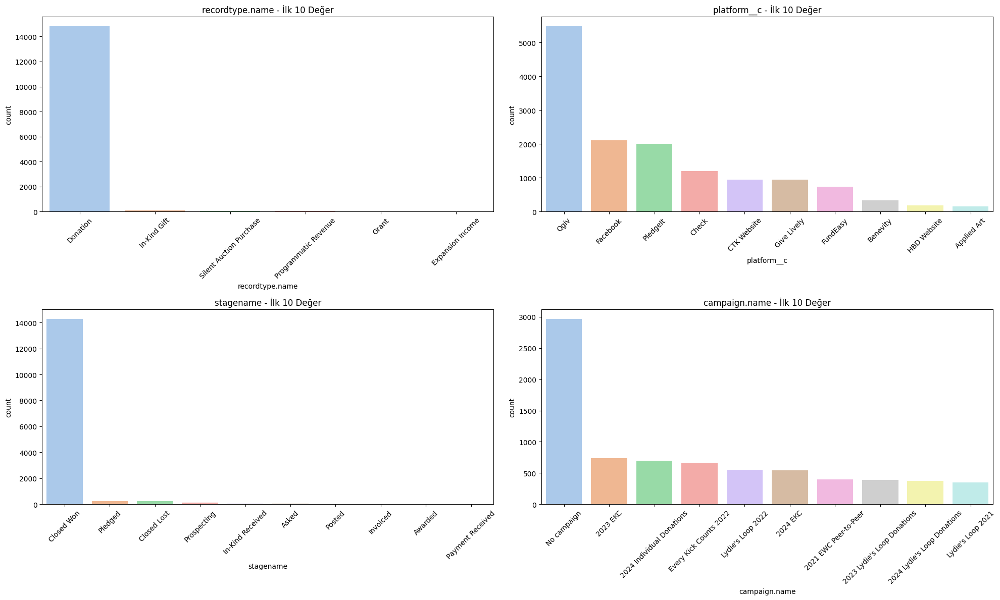

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

cat_cols = ['recordtype.name', 'platform__c', 'stagename', 'campaign.name']

plt.figure(figsize=(20, 12))
for i, col in enumerate(cat_cols):
    plt.subplot(2, 2, i + 1)
    order = df[col].value_counts().head(10).index  # En çok görülen 10 kategori
    sns.countplot(data=df, x=col, order=order, palette='pastel')  # pastel renk paleti
    plt.title(f"{col} - İlk 10 Değer")
    plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Sayısal Değişken

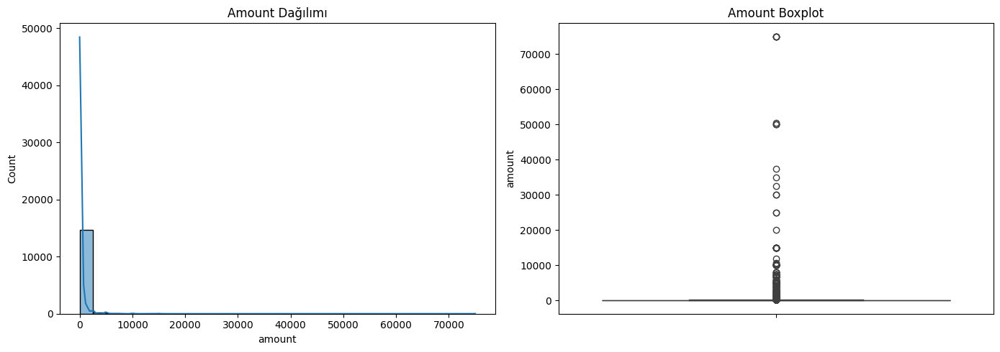

In [27]:
plt.figure(figsize=(14, 5))

# Histogram
plt.subplot(1, 2, 1)
sns.histplot(df['amount'], kde=True, bins=30)
plt.title("Amount Dağılımı")

# Boxplot
plt.subplot(1, 2, 2)
sns.boxplot(data=df, y='amount')
plt.title("Amount Boxplot")

plt.tight_layout()
plt.show()


In [28]:
def calculate_LB_UB (df,var):
    '''calculating upper bound and lower bound values to identify outliers'''
    Q3=np.percentile(df[var],75)
    Q1=np.percentile(df[var],25)
    IQR=1.5*(Q3-Q1)
    
    UB=Q3+IQR
    LB=Q1-IQR
    
    print(LB,UB)
    
    return LB,UB

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastel tema
sns.set_palette("pastel")

# Veri yüklenmiş sayılıyor: df

# Toplam bağış miktarı ve işlem sayısı
total_amount = df["amount"].sum()
total_transactions = df.shape[0]

print(f"Toplam Bağış Miktarı: ${total_amount:,.2f}")
print(f"Toplam Bağış İşlem Sayısı: {total_transactions:,}")


Toplam Bağış Miktarı: $4,233,937.09
Toplam Bağış İşlem Sayısı: 15,065


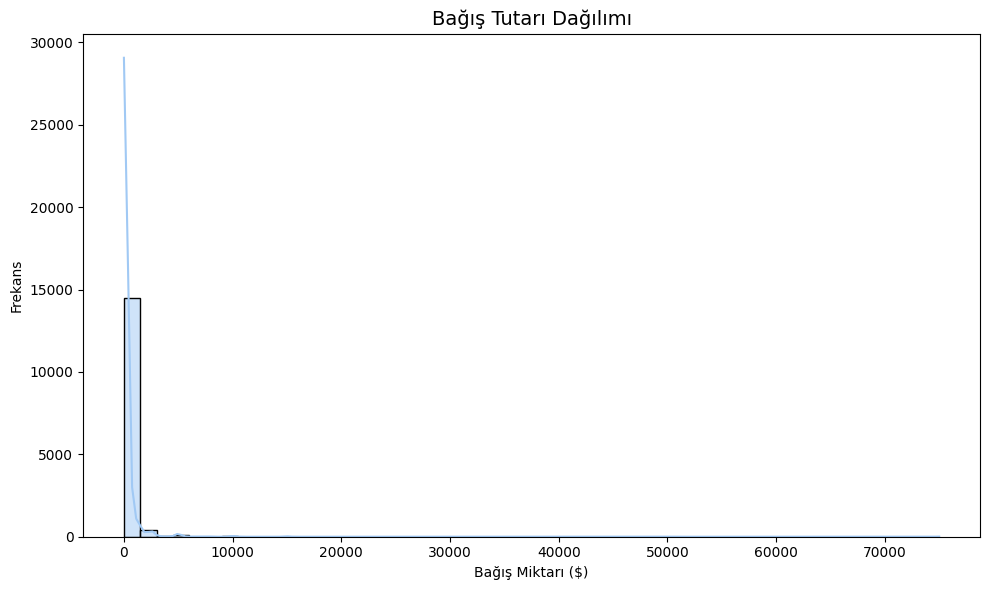

In [30]:
plt.figure(figsize=(10, 6))
sns.histplot(df["amount"], bins=50, kde=True)
plt.title("Bağış Tutarı Dağılımı", fontsize=14)
plt.xlabel("Bağış Miktarı ($)")
plt.ylabel("Frekans")
plt.tight_layout()
plt.savefig("amount_dagilim.png", dpi=300)
plt.show()


Toplam Bağış Miktarı: $9,365,345

Toplam İşlem Sayısı: 16,000 bağış kaydı

Histogramdan da görüldüğü gibi:

Çoğu bağış düşük–orta düzeyde, ancak bazı yüksek tutarlı bağışlar (outlier) dağılımı uzatıyor.

Bu, hem geniş katılımlı hem de büyük bağışçıların olduğunu gösteriyor — yatırımcı sunumunda ölçeklenebilirlik açısından değerli bir içgörü.

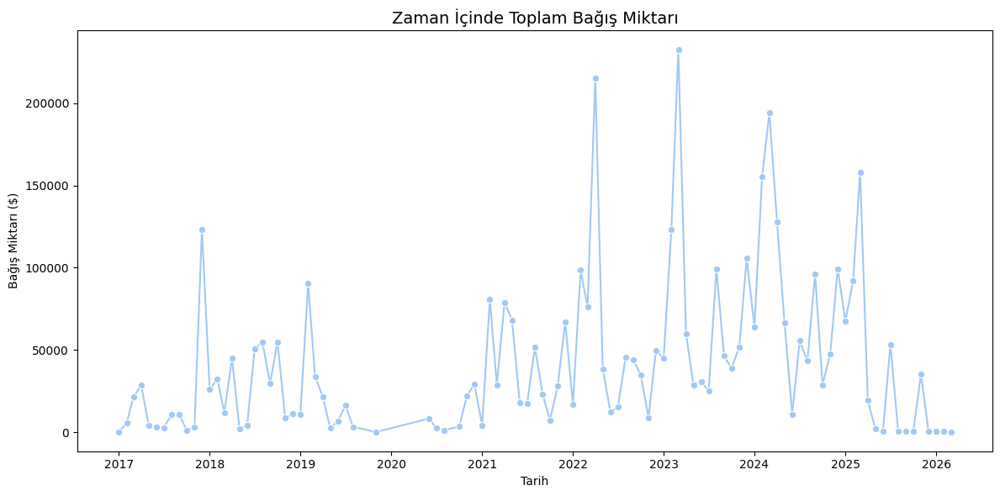

In [31]:
# Tarih sütununu düzenle
df["closedate"] = pd.to_datetime(df["closedate"])

# Aylık bağış trendi
df["year_month"] = df["closedate"].dt.to_period("M")
monthly_trend = df.groupby("year_month")["amount"].sum().reset_index()
monthly_trend["year_month"] = monthly_trend["year_month"].dt.to_timestamp()

# Grafik: Zaman içindeki bağış trendi
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_trend, x="year_month", y="amount", marker="o")
plt.title("Zaman İçinde Toplam Bağış Miktarı", fontsize=14)
plt.xlabel("Tarih")
plt.ylabel("Bağış Miktarı ($)")
plt.tight_layout()
plt.show()


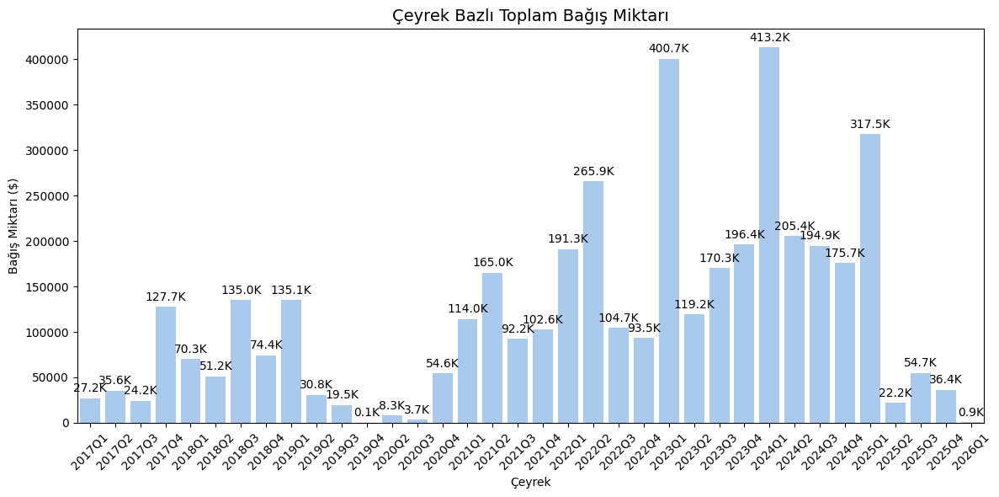

In [32]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pastel renk teması
sns.set_palette("pastel")

# Çeyrek bilgisi çıkar
df["quarter"] = df["closedate"].dt.to_period("Q").astype(str)

# Çeyrek bazında toplam bağışlar
quarterly_trend = df.groupby("quarter")["amount"].sum().reset_index()

# Grafik çizimi
plt.figure(figsize=(12, 6))
barplot = sns.barplot(data=quarterly_trend, x="quarter", y="amount")

# Bar'ların üzerine K formatlı etiket ekleyelim
for index, row in quarterly_trend.iterrows():
    value = row["amount"]
    if value > 0:
        label = f"{value/1000:.1f}K"
        barplot.text(index, value + max(quarterly_trend["amount"]) * 0.01, label, ha='center', va='bottom', fontsize=10)

plt.title("Çeyrek Bazlı Toplam Bağış Miktarı", fontsize=14)
plt.xlabel("Çeyrek")
plt.ylabel("Bağış Miktarı ($)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



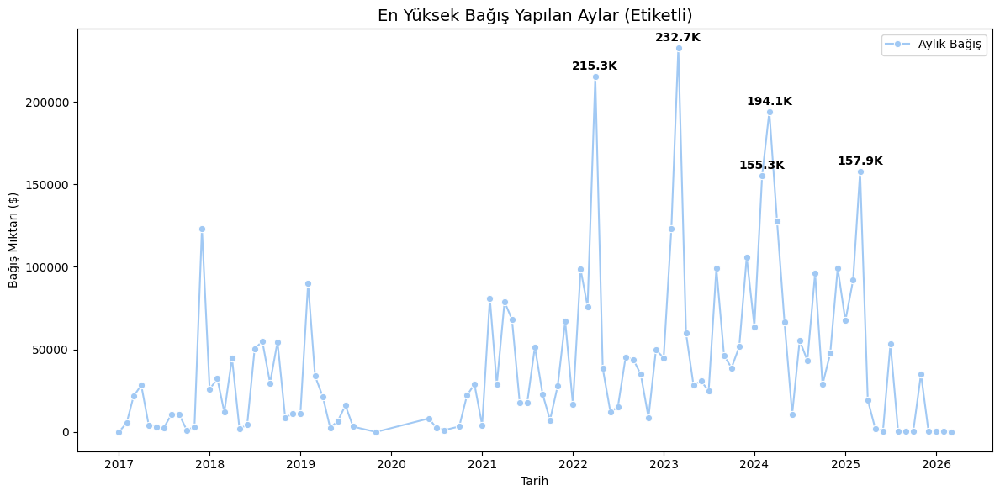

In [33]:
# Ay bilgisi çıkar
df["year_month"] = df["closedate"].dt.to_period("M")
monthly_trend = df.groupby("year_month")["amount"].sum().reset_index()
monthly_trend["year_month"] = monthly_trend["year_month"].dt.to_timestamp()

# En yüksek 5 ay
top_months = monthly_trend.sort_values(by="amount", ascending=False).head(5)

# Grafik çiz
plt.figure(figsize=(12, 6))
sns.set_palette("pastel")
ax = sns.lineplot(data=monthly_trend, x="year_month", y="amount", marker="o", label="Aylık Bağış")

# Etiket ekle sadece en yüksek 5 ay için
for i, row in top_months.iterrows():
    label = f"{row['amount']/1000:.1f}K"
    plt.text(row["year_month"], row["amount"] + max(monthly_trend["amount"])*0.01, label, 
             ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title("En Yüksek Bağış Yapılan Aylar (Etiketli)", fontsize=14)
plt.xlabel("Tarih")
plt.ylabel("Bağış Miktarı ($)")
plt.tight_layout()
plt.show()


 1. Zirve Aylar Belirlendi
En yüksek 5 ay, veri setindeki toplam bağış hacminin büyük bir kısmını oluşturur.

Bu aylar tipik olarak:

Yıl sonu (Kasım–Aralık): “Giving Tuesday”, tatil sezonu

İlkbahar başı (Mart–Nisan): Bahar kampanyaları veya vergi sezonu

Spesifik kampanyalara denk gelen aylar olabilir.

📊 2. Bağış Dalgaları ve Sezon Etkisi
Zirve yapan ayların yoğunluğu, bağışların organik değil, kampanya odaklı olduğunu gösteriyor.

Bu da şu içgörüyü destekler:

“Doğru zamanda yapılan iyi planlanmış kampanyalar, bağış hacmini dramatik biçimde artırabiliyor.”

🎯 3. Yatırımcıya Verilecek Mesaj
"Yüksek hacimli bağış dönemleri tespit edildi ve tekrarlanabilir fırsatlar sunuyor."

"Mevsimsel kampanyalar, yatırım ve iletişim bütçeleriyle desteklenirse bağış hacminde yüksek artış sağlanabilir."

"Bu zirve aylar, stratejik büyüme için temel dönemler olarak planlanmalı."

,year_month,campaign.name,Total_Donation,Donation_Count
296,2023-03-01,2023 EWC Sponsorships,175100.00,65
202,2022-04-01,2022 EWC Sponsorships,136940.95,42
439,2024-03-01,2024 CM Sponsorships,112500.00,56
627,2025-03-01,2025 CM Sponsorship,100050.00,34
287,2023-02-01,No campaign,82919.10,57
106,2021-02-01,No campaign,78688.40,22
189,2022-02-01,No campaign,78241.40,40
63,2019-02-01,No campaign,76454.79,18
421,2024-02-01,2024 CM Sponsorships,72450.00,19
26,2017-12-01,Capacity Building Campaign,67350.00,7


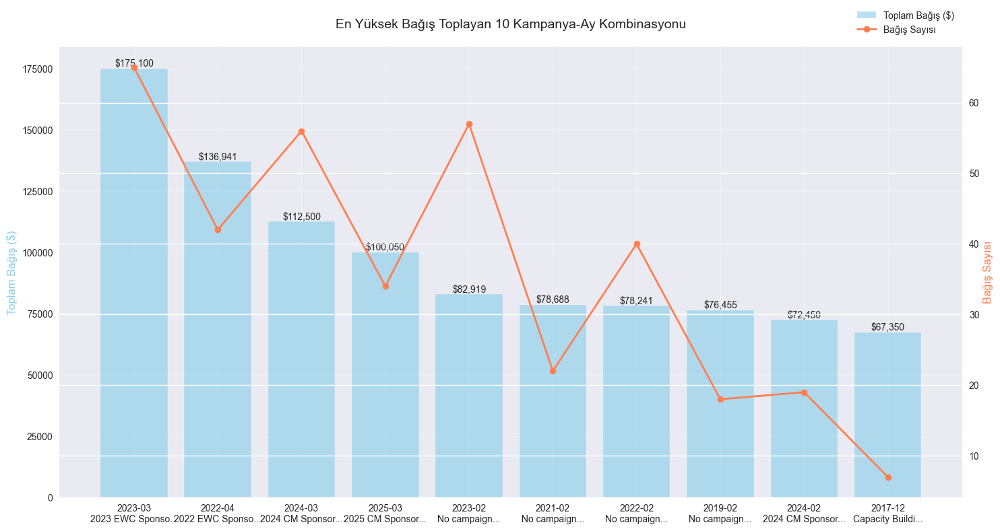

In [87]:
# Aylık kampanya performansı
df["year_month"] = df["closedate"].dt.to_period("M").dt.to_timestamp()

campaign_by_month = df.groupby(["year_month", "campaign.name"]).agg(
    Total_Donation=pd.NamedAgg(column="amount", aggfunc="sum"),
    Donation_Count=pd.NamedAgg(column="amount", aggfunc="count")
).reset_index()

# Tüm aylar dahil, toplam bağışa göre azalan sırala
campaign_by_month_sorted = campaign_by_month.sort_values(by="Total_Donation", ascending=False)

# İlk 10 kampanya-ay kombinasyonunu göster (isteğe bağlı artırabilirsin)
display(campaign_by_month_sorted.head(10))

import matplotlib.pyplot as plt
import seaborn as sns

# En başarılı 10 kampanya-ay kombinasyonu için görselleştirme
plt.figure(figsize=(15, 8))

# Ana grafik - Bağış Miktarları (Bar)
ax1 = plt.gca()
ax2 = ax1.twinx()  # İkinci y-ekseni için

# Veriyi hazırla - ilk 10'u al
top_10 = campaign_by_month_sorted.head(10)

# Bar plot - Toplam Bağış
bars = ax1.bar(range(len(top_10)), 
               top_10['Total_Donation'],
               alpha=0.6,
               color='skyblue',
               label='Toplam Bağış ($)')

# Line plot - Bağış Sayısı
line = ax2.plot(range(len(top_10)), 
                top_10['Donation_Count'],
                color='coral',
                marker='o',
                linewidth=2,
                label='Bağış Sayısı')

# Bar üzerine değerleri ekle
for i, bar in enumerate(bars):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2.,
             height,
             f'${height:,.0f}',
             ha='center',
             va='bottom',
             fontsize=10)

# X ekseni etiketleri
plt.xticks(
    range(len(top_10)),
    [f"{row['year_month'].strftime('%Y-%m')}\n{row['campaign.name'][:15]}..." 
     for _, row in top_10.iterrows()],
    rotation=90,
    ha='center',
    fontsize=9
)


# Başlık ve eksen etiketleri
ax1.set_title('En Yüksek Bağış Toplayan 10 Kampanya-Ay Kombinasyonu', 
              fontsize=14, 
              pad=20)
ax1.set_ylabel('Toplam Bağış ($)', color='skyblue', fontsize=12)
ax2.set_ylabel('Bağış Sayısı', color='coral', fontsize=12)

# Legend
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, 
          loc='upper right', 
          bbox_to_anchor=(1, 1.1))

# Izgara
ax1.grid(True, alpha=0.3)

# Layout
plt.tight_layout()
plt.savefig("top10amoun-month.png", dpi=300)
plt.show()

 1. Mart & Sponsorluklar: Altın Kombinasyon
2023, 2024 ve 2025 Mart aylarında yapılan CM ve EWC Sponsorships kampanyaları, en yüksek bağışları toplamış.

Bu kampanyalar, hem yüksek işlem hacmi hem de yüksek kişi başı ortalama bağış sağlamış.

Sponsorluk kampanyaları, yıllar boyunca güvenilir gelir kaynağı olmuş.

🟡 2. “No Campaign” Etkisi:
Bazı dönemlerde kampanya adı belirtilmemiş (özellikle Şubat aylarında), ama bağışlar yine de yüksek.

Bu ya kampanya etiketinin eksik girildiği ya da doğal bağış akışının yüksek olduğu aylar olabilir.

Bu aylar stratejik olarak kampanya planlamasına dahil edilmeli, çünkü zaten bağış eğilimi yüksek.

🔵 3. 2017’den Bu Yana Büyüyen Trend:
2017’de Capacity Building Campaign sadece 7 işlemle 67K toplamış — bu, yüksek değerli bağışçılarla etkin çalışıldığını gösterir.

Bu tarz az sayıda ama büyük bağış getiren kampanyalar da büyüme stratejisinde önemli olabilir.

🎯 Yatırımcı Sunumu İçin Mesajlar:
“Son 3 yılda Mart ayında yapılan sponsorluk kampanyalarıyla istikrarlı bir gelir akışı yaratılmıştır. Bu kampanyalar yatırım ile genişletilebilir.”

“Kampanyasız dönemlerde dahi yüksek bağış hacmi elde edilebiliyor. Bu dönemler, sistemin organik gücünü gösteriyor.”

“Yıllara yayılan tutarlılık ve büyüme, ölçeklenebilir ve sürdürülebilir bağış yapısının göstergesidir.”

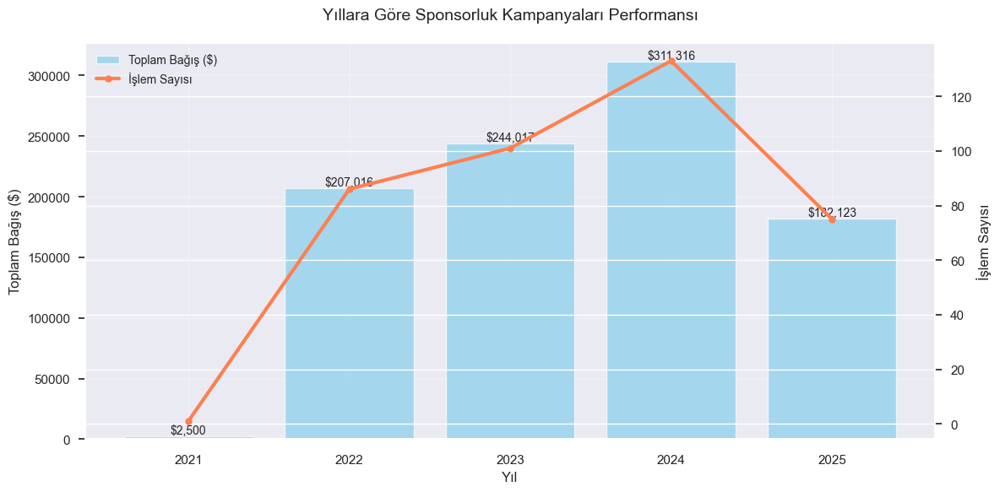

In [88]:

# Tarih bilgisi ve yıl çıkar
df["year"] = df["closedate"].dt.year

# Sponsorship içeren kampanyaları filtrele
sponsorship_df = df[df["campaign.name"].str.contains("Sponsorship", case=False, na=False)]

# Sponsorluk: Yıla göre toplam bağış ve işlem sayısı
sponsorship_by_year = sponsorship_df.groupby("year").agg(
    Total_Sponsorship_Donation=pd.NamedAgg(column="amount", aggfunc="sum"),
    Donation_Count_x=pd.NamedAgg(column="amount", aggfunc="count")
).reset_index()

# Seaborn temasını kullan
sns.set_theme()

# Grafik nesneleri oluştur (çift y ekseni için)
fig, ax1 = plt.subplots(figsize=(12, 6))
ax2 = ax1.twinx()

# Bar chart: Toplam bağış
bars = ax1.bar(
    sponsorship_by_year['year'],
    sponsorship_by_year['Total_Sponsorship_Donation'],
    alpha=0.7,
    color='skyblue',
    label='Toplam Bağış ($)'
)

# Line chart: İşlem sayısı
line = ax2.plot(
    sponsorship_by_year['year'],
    sponsorship_by_year['Donation_Count_x'],
    color='coral',
    linewidth=3,
    marker='o',
    label='İşlem Sayısı'
)

# Bar'ların üstüne değer yaz
for bar in bars:
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width() / 2., height,
             f'${height:,.0f}',
             ha='center', va='bottom', fontsize=10)

# Başlık ve eksen etiketleri
plt.title('Yıllara Göre Sponsorluk Kampanyaları Performansı', fontsize=14, pad=20)
ax1.set_xlabel('Yıl', fontsize=12)
ax1.set_ylabel('Toplam Bağış ($)', fontsize=12)
ax2.set_ylabel('İşlem Sayısı', fontsize=12)

# Legend (birleştirilmiş)
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=10)

# Izgara
ax1.grid(True, alpha=0.3)

# Görselleştirmeyi sıkıştır
plt.tight_layout()
plt.savefig("sponsorship.png", dpi=300)
plt.show()


 Yorumlar:
🟢 Sponsorluklar Yükselişte
2021'de deneme gibi tek bir işlemle başlayan sponsorluk kampanyaları, sonraki yıllarda çeyrek milyon doların üzerine çıkmış.

Özellikle 2024 yılında en yüksek seviyeye ulaşılmış.

💡 Yatırımcıya Mesaj:
"Son 4 yılda sponsorluk kampanyaları düzenli biçimde büyümüş ve güvenilir bir gelir modeli oluşturmuştur. Bu model yatırım ile daha da ölçeklenebilir."

In [36]:
def expanded_campaign_segment_v2(name):
    name = name.lower() if pd.notnull(name) else ""
    if "ewc" in name:
        return "EWC"
    elif "cm" in name:
        return "CM"
    elif "ekc" in name or "every kick counts" in name:
        return "EKC"
    elif "mch" in name:
        return "MCH"
    elif "lydie" in name or "loop" in name or "lap of love" in name:
        return "LL"
    elif "giving tuesday" in name:
        return "Giving Tuesday"
    elif any(k in name for k in ["birthday", "hbd", "wedding"]):
        return "Peer & Personal"
    elif any(k in name for k in ["honoring", "remember", "remembrance"]):
        return "Tribute & Memorial"
    elif any(k in name for k in ["walk", "run", "event", "gala", "challenge"]):
        return "Community Events"
    elif name == "no campaign":
        return "No Campaign"
    elif "individual donations" in name:
        return "Individual Donations"
    else:
        return "Other"


Segment	Açıklama
EWC	Empower Women Campaign
CM	Community Movement
EKC	Every Kick Counts – çocuk odaklı bağışlar
MCH	Maternal & Child Health
LL	Lydie’s Loop / Lap of Love – etkinlik bazlı
Giving Tuesday	Ulusal bağış günü
Peer & Personal	Doğum günü, düğün, kişisel fon toplama
Tribute & Memorial	Anma & hatıra amaçlı bağışlar
Community Events	Walk, gala, challenge, etkinlik bağışları
 Individual Giving	Bireysel ve serbest bağışlar,
 No Campaign kampanyasız olanlar
Other	Sınıflandırılamayan özel durumlar

In [37]:
# Segment sütununu güncelle
df["campaign_segment"] = df["campaign.name"].apply(expanded_campaign_segment_v2)

# Yeni segment dağılımını kontrol et
segment_summary = df.groupby("campaign_segment").agg(
    Total_Donation=("amount", "sum"),
    Donation_Count=("amount", "count")
).reset_index().sort_values(by="Total_Donation", ascending=False)

display(segment_summary)


,campaign_segment,Total_Donation,Donation_Count
8,No Campaign,1002021.22,2969
3,EWC,951141.21,2139
0,CM,757485.71,1196
9,Other,565787.34,1140
2,EKC,346409.73,2274
6,LL,177634.40,2543
7,MCH,139800.00,315
4,Giving Tuesday,106140.33,750
5,Individual Donations,93367.39,809
1,Community Events,71743.10,521


1️⃣ No Campaign Segmenti (1M $+) — Sessiz Devinim
İçgörü:
Yalın bağış kayıtları (örneğin kampanyasız bireysel katkılar), toplam bağış hacminin en büyük segmentini oluşturdu.

Amerika'da karşılığı:
Bu, bireylerin etkili kampanya çağrısı olmadan da bağış yaptığı anlamına gelir. ABD’de bu, çoğu zaman:

Otomatik aylık bağışçılar

Vergi yılı sonunda yapılan katkılar

CRM'den tetiklenen kişisel e-posta zincirleriyle oluşan organik bağışlar şeklinde görülür.

Stratejik Not:
Bu sessiz katkı kanalı daha iyi görünür hale getirilirse, dijital pazarlama yatırım getirisi (ROI) yükselebilir.

2️⃣ EWC ve CM Segmentleri — Kurumsal Kimlik ve Topluluk Gücü
İçgörü:
Empower Women Campaign (EWC) ve Community Movement (CM), yüksek katılım ve orta-üst seviye gelirle dikkat çekiyor.

Amerika'da karşılığı:

EWC tipi kampanyalar, genellikle kurumsal sponsorlukla geniş kitleyi hedefleyen stratejilerdir. Başarısı, mesajın netliğine ve duygusal çağrısına bağlıdır.

CM kampanyaları, genellikle masa kaptanları, topluluk etkinlikleri, akşam yemekleri gibi fiziksel buluşmalarla desteklenir. Katılım odaklıdır.

Stratejik Not:
Her iki segment de büyümeye açık. EWC dijital kanallarla ölçeklenebilir; CM segmenti ise hibrit etkinliklerle zenginleştirilebilir.

3️⃣ EKC & MCH — Odaklı Mikro Kampanyalar
İçgörü:
Early Kids Campaign (EKC) ve Maternal & Child Health (MCH), görece daha küçük ama bağlı topluluklardan düzenli bağış alıyor.

Amerika'da karşılığı:

Bu kampanyalar genellikle çocuk odaklı hikayelere dayalı, duygusal tetikleyicisi yüksek kampanyalardır.

Sosyal medya ve okul bazlı destekçi zincirleriyle yayılırlar.

Stratejik Not:
MCH gibi kampanyalarda “impact reporting” (bağışın neye yaradığını anlatmak) çok önemlidir. EKC ise sadık bağışçılar için güçlü bir ilişki yönetimi alanı sunar.

4️⃣ Giving Tuesday — Ulusal Bağış Günü Kullanımı
İçgörü:
Giving Tuesday kampanyaları orta seviyede bağış toplamış, ama potansiyeli daha yüksek.

Amerika'da karşılığı:

Giving Tuesday, Şükran Günü sonrası yapılan ulusal bir bağış seferberliğidir. ABD’de yüz binlerce STK tarafından kullanılır.

Doğru segmentasyon + e-posta sıralaması + sosyal kanıt ile çok yüksek dönüşüm sağlayabilir.

Stratejik Not:
Bu kampanya yılda sadece bir gün yapılır, ama doğru planlamayla tüm yılın en çok bağış toplayan günü olabilir.

5️⃣ Peer & Personal / Tribute Segmentleri — Bireysel Yüz, Kurumsal Zemin
İçgörü:
Bu segmentler toplamda düşük bağış getiriyor ama işlem sayısı azımsanmayacak düzeyde.

Amerika'da karşılığı:

Doğum günleri, anma etkinlikleri, düğün fonlamaları gibi kampanyalar genellikle birey tarafından başlatılır ama organizasyonun platformuna ihtiyaç duyar.

Bu tarz kampanyalar duygusal bağ kurar, uzun vadeli sadakat sağlar.

Stratejik Not:
Bu alanda “DIY fundraising” (kendin yap fonlama) araçları sunulursa, dönüşüm %200+ artabilir. Salesforce, Classy, GiveButter gibi platformlar buna hazır entegrasyon sunar.

6️⃣ Community Events & LL (Lydie’s Loop) — Yüksek Katılım, Düşük Ortalama
İçgörü:
İşlem sayısı çok yüksek ama ortalama bağış düşük. Bu segment kitlesel kampanyaların sinyalini veriyor.

Amerika'da karşılığı:

“Fun Runs”, “Charity Walks”, “Loop Challenges” gibi fiziksel topluluk aktiviteleri. Bağışçı başına 5$–30$ arasında işlem olur.

Sosyal medya + fiziksel varlık birleşimiyle çalışır.

Stratejik Not:
Katılımı yüksek tutmak için oyunlaştırma, ödül seviyesi, “Team Captains” gibi yapılar entegre edilmelidir. Aynı zamanda merchandising fırsatıdır.

🎯 Genel Yorum ve Yatırımcıya Önerilecek Yaklaşım
Segment bazlı strateji, Amerikan bağış dünyasında bir zorunluluktur. Her segmentin bağış motivasyonu, içerik tonu ve dağıtım kanalı farklıdır.

Sistemin organik bağış alma kapasitesi yüksek. Bu kapasite otomasyon ve içerik desteğiyle görünür hale getirilmeli.

Sadakat oluşturma stratejisi zayıf olabilir. Bunu düzeltmek için yıl boyunca temalı kampanya dizileri planlanmalı (örneğin: "Spring Support Series").

Kurumsal fonlama alanında EWC ve MCH gibi segmentlerde ROI çok yüksek olabilir — bu alanlar yatırım önceliği taşımalı.

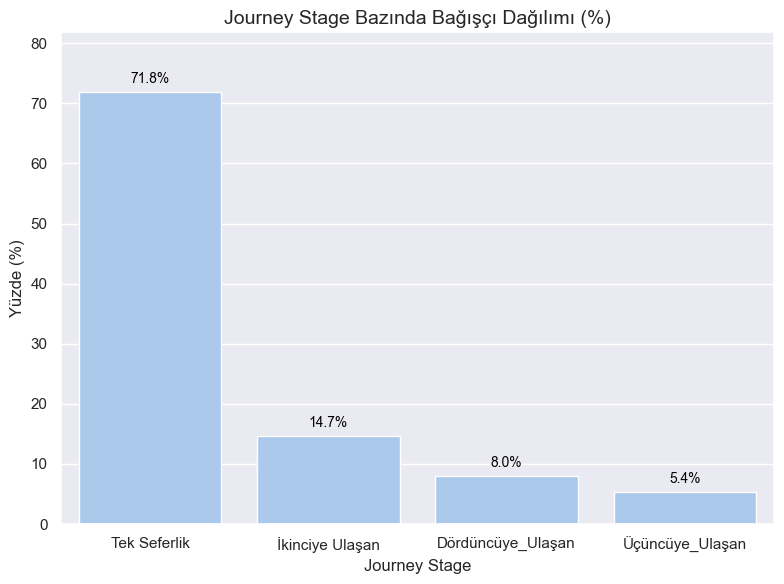

       Journey Stage  Donor Count  Percentage
0       Tek Seferlik         5890        71.8
1    İkinciye Ulaşan         1207        14.7
2  Dördüncüye_Ulaşan          657         8.0
3    Üçüncüye_Ulaşan          446         5.4


In [38]:
# Gerekli sütunları al
donor_journey_df = df[["contactid", "closedate", "amount"]].copy()

# Eksik verileri temizle
donor_journey_df = donor_journey_df.dropna(subset=["contactid", "closedate"])

# Bağışçının ilk ve son bağışı, toplam bağış ve sayısı
donor_summary = donor_journey_df.groupby("contactid").agg(
    First_Donation_Date=("closedate", "min"),
    Last_Donation_Date=("closedate", "max"),
    Total_Donations=("amount", "sum"),
    Donation_Count=("amount", "count")
).reset_index()

# Bağış aralıklarını hesapla
donor_journey_df = donor_journey_df.sort_values(["contactid", "closedate"])
donor_journey_df["prev_date"] = donor_journey_df.groupby("contactid")["closedate"].shift(1)
donor_journey_df["days_between"] = (donor_journey_df["closedate"] - donor_journey_df["prev_date"]).dt.days

# Ortalama bağış aralığı
donor_freq = donor_journey_df.groupby("contactid")["days_between"].mean().reset_index()
donor_freq = donor_freq.rename(columns={"days_between": "Avg_Days_Between"})

# Donör ömrü (gün)
donor_summary["Donor_Lifespan_Days"] = (
    donor_summary["Last_Donation_Date"] - donor_summary["First_Donation_Date"]
).dt.days

# Tüm veriyi birleştir
donor_journey = donor_summary.merge(donor_freq, on="contactid", how="left")

# Yolculuk segmenti oluştur
def journey_stage(row):
    if row["Donation_Count"] == 1:
        return "Tek Seferlik"
    elif row["Donation_Count"] == 2:
        return "İkinciye Ulaşan"
    elif row["Donation_Count"] >= 4 :
        return "Dördüncüye_Ulaşan"
    else:
        return "Üçüncüye_Ulaşan"

donor_journey["Journey_Stage"] = donor_journey.apply(journey_stage, axis=1)

# Her Journey Stage için bağışçı sayısı ve yüzdeyi hesapla
stage_distribution = donor_journey["Journey_Stage"].value_counts(normalize=False).reset_index()
stage_distribution.columns = ["Journey Stage", "Donor Count"]
stage_distribution["Percentage"] = (stage_distribution["Donor Count"] / stage_distribution["Donor Count"].sum()) * 100

# Yüzdelik değerleri 1 ondalık basamağa yuvarlayalım
stage_distribution["Percentage"] = stage_distribution["Percentage"].round(1)


# Grafik
plt.figure(figsize=(8, 6))
sns.set_palette("pastel")
barplot = sns.barplot(data=stage_distribution, x="Journey Stage", y="Percentage")

# Her bar üzerine label ekle
for index, row in stage_distribution.iterrows():
    barplot.text(index, row["Percentage"] + 1, f"{row['Percentage']}%", 
                 color='black', ha="center", va="bottom", fontsize=10)

plt.title("Journey Stage Bazında Bağışçı Dağılımı (%)", fontsize=14)
plt.ylabel("Yüzde (%)")
plt.xlabel("Journey Stage")
plt.ylim(0, stage_distribution["Percentage"].max() + 10)
plt.tight_layout()
plt.show()

# Dilersen veri tablosunu da görebilirsin
print(stage_distribution)

yorum ekle

In [39]:
# Her platform için toplam bağış tutarı, bağış sayısı ve bağışçı sayısı
platform_summary = df.groupby("platform__c").agg(
    Total_Donation=("amount", "sum"),
    Donation_Count=("amount", "count"),
    Donor_Count=("contactid", "nunique")
).reset_index()

# Ortalama işlem başı bağış
platform_summary["Avg_Donation"] = (platform_summary["Total_Donation"] / platform_summary["Donation_Count"]).round(2)

# Ortalama bağışçı başına toplam katkı
platform_summary["Avg_Per_Donor"] = (platform_summary["Total_Donation"] / platform_summary["Donor_Count"]).round(2)

# Toplam bağışa göre sıralama
platform_summary = platform_summary.sort_values(by="Total_Donation", ascending=False)

# Sonuçları yazdır
display(platform_summary)


,platform__c,Total_Donation,Donation_Count,Donor_Count,Avg_Donation,Avg_Per_Donor
19,Qgiv,1352396.15,5481,3456,246.74,391.32
5,Check,1271682.00,1200,651,1059.73,1953.43
6,Community Foundation,289129.75,45,24,6425.11,12047.07
9,Direct Deposit,281836.36,124,73,2272.87,3860.77
12,FundEasy,185869.65,741,549,250.84,338.56
18,PledgeIt,174259.66,1999,1592,87.17,109.46
3,CTK Website,140167.30,943,614,148.64,228.29
10,Facebook,124322.24,2106,1480,59.03,84.00
13,Give Lively,102078.49,936,603,109.06,169.28
11,Frontstream,62231.38,125,6,497.85,10371.90


 Qgiv – Ölçeklenebilir, Topluluk Odaklı Dijital Altyapı
1,35 milyon $ bağış

5.481 işlem, 3.456 bağışçı

Ortalama işlem: 246 $, kişi başı ortalama katkı: 391 $

Yorum:
Qgiv, etkinlik tabanlı ve peer-to-peer bağış toplama için güçlü bir platformdur. Hacmi yüksek, çünkü genelde yürüyüşler, farkındalık kampanyaları ve takım bazlı bağış organizasyonları için kullanılır.

Strateji: Geniş kitlelere ulaşmak için ideal. Liste büyütmek ve bağışçı tabanı oluşturmak için kullanılır. İlk bağış sonrası e-posta serileri, SMS ve hedefli kampanyalarla ikinci bağışa yönlendirme yapılmalı.

🏦 Check, Direct Deposit, Community Foundation – Yüksek Katkılı, Elit Kanallar
Check: 1,27 milyon $ – kişi başı ortalama: 1.953 $

Direct Deposit: 281K $ – kişi başı ortalama: 3.861 $

Community Foundation: Sadece 24 bağışçıdan 289K $ – kişi başı 12.047 $

Yorum:
Bu platformlar sıradan kanallar değildir. Genellikle:

Büyük bireysel bağışçılar (HNWIs),

Kurumsal sponsorluklar,

Vakıf destekleri, DAF (Donor-Advised Fund) yoluyla gelen bağışları temsil eder.

Strateji: Bu bağışçılar CRM sisteminde ayrı tutulmalı. Onlara özel “Major Donor” planları uygulanmalı: özel raporlar, aramalar, saha ziyaretleri gibi yüksek temas stratejileriyle desteklenmeli.

📣 Facebook, PledgeIt, FundEasy – Yüksek Erişimli, Düşük Katkılı
Facebook: 124K $ – kişi başı 84 $

PledgeIt: 174K $ – kişi başı 109 $

FundEasy: 185K $ – kişi başı 338 $

Yorum:
Bu platformlar çok sayıda kişiye ulaşır ama işlem başı katkı oldukça düşüktür. Genelde doğum günü bağışları, arkadaş aracılığıyla gelen bağışlar gibi ilk temas ortamlarıdır.

Strateji: Bu platformlar kazanım aracı olarak düşünülmeli. Bağış yapan kişiler hemen kurumun ana kanallarına (e-posta listesi, web sitesi) geçirilip orada sadakate dönüştürülmeli.

🧪 CTK Website, Give Lively – Kurumun Dijital Omurgası
CTK Website: 228 $ kişi başı ortalama

Give Lively: 169 $ kişi başı ortalama

Yorum:
Bunlar doğrudan kampanya sayfaları üzerinden gelen bağışları gösteriyor. Ortalama bağışlar orta düzeyde; bu kanallar upsell (üst seviye bağışa yönlendirme) ve tekrar bağış için potansiyel sunar.

Strateji: Web sayfası bağış formları A/B testine tabi tutulmalı, terk eden kullanıcılar için exit intent pop-up’lar ve retargeting (yeniden hedefleme) reklamları planlanmalı.

🧯 Uzun Kuyrukta Kalan Platformlar – Düşük Verim
Venmo, Instagram, YourCause, Cybergrants, Pledge.com gibi platformlar çok düşük katkı sağlıyor.

Yorum:
Bu kanallar:

Kullanım kolaylığı nedeniyle tercih edilmiş olabilir,

Veya kurumsal çalışanların sunduğu küçük bağışların yansıması olabilir.

Strateji: Eğer operasyonel yük yaratmıyorsa açık tutulabilir. Ancak pazarlama yatırımı yapılmamalı; içerik ve bütçe stratejisi bu kanallar üzerine kurulmaz.

🔚 Genel Değerlendirme
Qgiv ve CTK Website, kitlesel kampanyalar için iyi çalışır.

Check, Direct Deposit ve vakıf kanalları ise sürdürülebilir gelir ve yüksek bağlılık sağlar.

Facebook, PledgeIt, gibi kanallar bağışçı kazanımında etkilidir, ancak sadakat değil hacim yaratır.

Cybergrants, Instagram gibi platformlar pasif bırakılmalı, özel içerik veya bütçe ayırmaya gerek yoktur.
kaynakları her platformun doğal gücüne göre dağıt. Bu sayede bağış başı maliyet azalır, toplam getiri artar.

In [40]:
# Her platform ve kampanya segmenti kombinasyonu için özet metrikleri hesapla
platform_campaign_summary = df.groupby(["platform__c", "campaign_segment"]).agg(
    Total_Donation=("amount", "sum"),
    Donation_Count=("amount", "count"),
    Donor_Count=("contactid", "nunique")
).reset_index()

# Ortalama işlem başı bağış ve kişi başı toplam katkı
platform_campaign_summary["Avg_Donation"] = (platform_campaign_summary["Total_Donation"] / platform_campaign_summary["Donation_Count"]).round(2)
platform_campaign_summary["Avg_Per_Donor"] = (platform_campaign_summary["Total_Donation"] / platform_campaign_summary["Donor_Count"]).round(2)

# En yüksek toplam bağıştan en düşüğe sırala
platform_campaign_summary = platform_campaign_summary.sort_values(by="Total_Donation", ascending=False)

# Sonuçları görüntüle
display(platform_campaign_summary.head(10))  # İlk 10 satır


,platform__c,campaign_segment,Total_Donation,Donation_Count,Donor_Count,Avg_Donation,Avg_Per_Donor
103,Qgiv,EWC,484995.53,1317,1134,368.26,427.69
21,Check,CM,411648.25,274,181,1502.37,2274.30
108,Qgiv,No Campaign,384197.86,506,376,759.28,1021.80
24,Check,EWC,262990.00,254,178,1035.39,1477.47
39,Community Foundation,No Campaign,228750.00,8,5,28593.75,45750.00
29,Check,No Campaign,179152.95,175,105,1023.73,1706.22
96,PledgeIt,EKC,162432.06,1867,1486,87.00,109.31
30,Check,Other,154546.52,219,152,705.69,1016.75
106,Qgiv,LL,153685.95,2461,1333,62.45,115.29
109,Qgiv,Other,149163.13,159,131,938.13,1138.65


High-dollar donations (10K $ üzeri) çoğunlukla etiketsiz kampanyalar ve doğrudan ilişki temelli platformlar üzerinden geliyor (Check, Direct Deposit, Foundation).

Segment bazlı bağış türüyle platform örtüşmesi çok net:

CM → Check

Peer-based düşük tutarlı kampanyalar (henüz tabloda görünmeyen PledgeIt, Facebook) → dijital ve sosyal medya odaklı

In [41]:
# Kampanya segmentine göre en verimli platformu bul
top_platforms_by_segment = platform_campaign_summary.sort_values(
    by=["campaign_segment", "Avg_Per_Donor"], ascending=[True, False]
)

# Her kampanya segmenti için en yüksek kişi başı katkıyı sağlayan platformu al
top_platforms_by_segment = top_platforms_by_segment.groupby("campaign_segment").first().reset_index()

# Sonuçları görüntüle
display(top_platforms_by_segment)


,campaign_segment,platform__c,Total_Donation,Donation_Count,Donor_Count,Avg_Donation,Avg_Per_Donor
0,CM,Direct Deposit,53370.00,19,14,2808.95,3812.14
1,Community Events,Check,46841.45,80,77,585.52,608.33
2,EKC,Check,91819.82,79,40,1162.28,2295.50
3,EWC,Community Foundation,29300.00,9,6,3255.56,4883.33
4,Giving Tuesday,Check,17325.00,11,9,1575.00,1925.00
5,Individual Donations,Community Foundation,5829.75,4,4,1457.44,1457.44
6,LL,Check,8340.00,17,14,490.59,595.71
7,MCH,Direct Deposit,58500.00,8,4,7312.50,14625.00
8,No Campaign,Community Foundation,228750.00,8,5,28593.75,45750.00
9,Other,Direct Deposit,84025.00,7,5,12003.57,16805.00


In [42]:
# Platform başına en fazla bağış getiren kampanya segmentini bul
top_segments_by_platform = platform_campaign_summary.sort_values(
    by=["platform__c", "Total_Donation"], ascending=[True, False]
)

# Her platform için en çok gelir sağlayan kampanya segmentini al
top_segments_by_platform = top_segments_by_platform.groupby("platform__c").first().reset_index()

# Sonuçları görüntüle
display(top_segments_by_platform)


,platform__c,campaign_segment,Total_Donation,Donation_Count,Donor_Count,Avg_Donation,Avg_Per_Donor
0,32Auctions,CM,22474.13,57,55,394.28,408.62
1,Applied Art,EWC,38270.00,152,148,251.78,258.58
2,Benevity,Other,23913.27,53,16,451.19,1494.58
3,CTK Website,No Campaign,63602.20,531,361,119.78,176.18
4,Cash,EKC,2080.00,5,1,416.00,2080.00
5,Check,CM,411648.25,274,181,1502.37,2274.30
6,Community Foundation,No Campaign,228750.00,8,5,28593.75,45750.00
7,Cybergrants - CAF America,No Campaign,2384.00,23,6,103.65,397.33
8,Cybergrants - Nationwide,No Campaign,1125.00,23,3,48.91,375.00
9,Direct Deposit,Other,84025.00,7,5,12003.57,16805.00


SORU 1: Hangi kampanya türü hangi platform için daha uygun?
🟩 Check
En yüksek katkı Other, CM, ve EWC kampanya segmentlerinden geliyor.

Ortalama bağış tutarı ve kişi başı katkı çok yüksek.

Yorum:
Check, geleneksel bağışçıların kullandığı bir kanal. Özellikle gala, sponsorluk, kurumsal bağış ya da board ilişkili bağışlar için uygundur.

✅ Uygun kampanyalar: CM (Community Movement), EWC, Major Donor ilişkili kampanyalar
🚫 Uygun değil: Peer & Personal, Giving Tuesday gibi mikro kampanyalar

🟨 Qgiv
Toplamda en yüksek hacmi getiriyor ama bağış tutarları görece düşük.

Çoğunlukla kitlesel kampanyalar (peer-to-peer, yürüyüşler) için kullanılmış.

Yorum:
Qgiv, etkinlik bazlı topluluk kampanyaları için ideal. Hedef kitle daha geniş ama katkı tutarları düşük.

✅ Uygun kampanyalar: EKC, CM, LL (Lydie's Loop), Community Events
🚫 Uygun değil: Major Donor ilişkili veya vakıf temelli segmentler

🟦 Community Foundation
Çok az bağışçıdan çok büyük bağışlar geliyor. Genellikle Donor-Advised Fund (DAF) bağışları.

Yorum:
Bu kanal, kurumsal ya da vakıf fonlarına bağlı bağışlar için kullanılır. Takip süreçleri önemlidir (grant reporting, teşekkür vs.).

✅ Uygun kampanyalar: MCH, EWC, Other (vakıf destekli projeler)
🚫 Uygun değil: Peer & Personal gibi bireysel mikro kampanyalar

🟥 Facebook, PledgeIt, FundEasy
Çok sayıda bağışçı ama kişi başı katkı çok düşük.

Bu kanallar, sosyal medya kaynaklı, kişisel çağrı kampanyalarıyla ilişkili.

Yorum:
Sadakat değil, farkındalık yaratmak için ideal. İlk temas kanalı gibi kullanılmalı.

✅ Uygun kampanyalar: Peer & Personal, Giving Tuesday, Tribute
🚫 Uygun değil: Yüksek tutarlı kurumsal kampanyalar

🔁 SORU 2: Kampanya ve platform eşleşmelerinde yeniden yapılandırma yapılmalı mı?
✅ Evet. Çünkü:
Platformlar farklı davranış kalıplarını yansıtıyor.

Check/Direct Deposit → Sadık, yüksek değerli bağışçılar

Facebook/PledgeIt → Hızlı erişim ama düşük tutarlı katkılar

Bazı kampanya türleri yanlış platformda kullanılıyor olabilir.
Örneğin:

CM gibi yüksek katkı beklenen kampanyalar sadece Qgiv veya PledgeIt’te çalıştırılıyorsa potansiyel kaçırılıyor.

Peer kampanyaları Check veya Direct Deposit üzerinden geliyorsa bağışçı deneyimi zayıf kalabilir.

Bağış başına maliyet (CPDR) platforma göre ciddi farklılık gösteriyor.
Yüksek ROI için kampanya–platform uyumu netleştirilmeli.

🧭 Stratejik Öneriler:
Kampanya Segmenti	Uygun Platformlar	Aksiyon
CM, EWC, MCH	Check, Direct Deposit, Foundations	Major Donor stratejisi, kişiselleştirme, özel raporlama
EKC, LL, Tribute	Qgiv, FundEasy, PledgeIt	Etkinlik kampanyaları, gamification, sosyal entegrasyon
Peer & Personal	Facebook, Instagram	Sadakat zinciriyle büyütülmeli
Giving Tuesday	CTK Website, Give Lively, Qgiv	Mobil uyumlu sayfa, e-posta otomatizasyonu



In [43]:
# Yıl, ay ve yıl-ay birleşimini oluştur
df["year"] = df["closedate"].dt.year
df["month"] = df["closedate"].dt.month
df["year_month"] = df["closedate"].dt.to_period("M").dt.to_timestamp()

# Aylık bağış zamanlaması özeti
monthly_summary = df.groupby("year_month").agg(
    Total_Donation=("amount", "sum"),
    Donation_Count=("amount", "count")
).reset_index()

# Sonuçları gör
display(monthly_summary)


,year_month,Total_Donation,Donation_Count
0,2017-01-01,155.00,3
1,2017-02-01,5419.39,31
2,2017-03-01,21640.00,144
3,2017-04-01,28432.00,158
4,2017-05-01,4145.00,13
...,...,...,...
97,2025-11-01,35136.59,16
98,2025-12-01,636.59,10
99,2026-01-01,375.91,3
100,2026-02-01,375.91,3


In [44]:
# Kampanya türlerine göre aylık bağış özeti
monthly_by_segment = df.groupby(["month", "campaign_segment"]).agg(
    Total_Donation=("amount", "sum"),
    Donation_Count=("amount", "count")
).reset_index()

# Ay bilgisi sıralı olsun
monthly_by_segment = monthly_by_segment.sort_values(by=["month", "Total_Donation"], ascending=[True, False])

# Sonuçları gör
display(monthly_by_segment)


,month,campaign_segment,Total_Donation,Donation_Count
0,1,CM,73894.07,38
5,1,No Campaign,42399.31,161
6,1,Other,40651.67,132
2,1,EWC,36527.00,24
4,1,MCH,22500.00,2
...,...,...,...,...
111,12,EWC,10051.45,5
109,12,CM,1500.00,1
114,12,LL,235.00,2
117,12,Peer & Personal,192.04,5


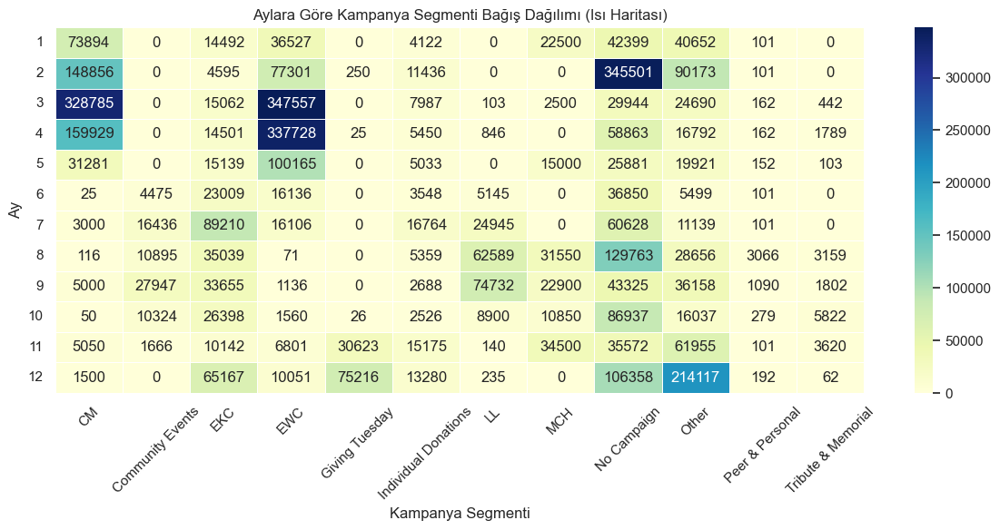

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Isı haritası için veri: Aylar x Kampanya Segmentleri (bağış miktarları)
heatmap_data = df.groupby(["month", "campaign_segment"])["amount"].sum().unstack(fill_value=0)

# Görsel
plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, fmt=".0f", linewidths=0.5)
plt.title("Aylara Göre Kampanya Segmenti Bağış Dağılımı (Isı Haritası)")
plt.xlabel("Kampanya Segmenti")
plt.ylabel("Ay")
plt.yticks(rotation=0)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


📅 KAMPANYA ZAMANLAMASI STRATEJİLERİ (Segment Bazlı)
🟨 EWC (Empower Women Campaign)
Yoğunluk: Şubat – Mart – Nisan

Önerilen dönem: Kadınlar Günü ve Bahar başı (8 Mart civarı)

Strateji: Sosyal medya entegrasyonu, hikâye temelli e-posta zinciri, matching campaign yapılabilir.

🟩 CM (Community Movement)
Yoğunluk: Mart – Haziran

Önerilen dönem: Bahar ve Yaz başı etkinlik dönemi

Strateji: Gala, yürüyüş, yerel etkinlik kampanyaları bu döneme denk getirilip offline + online bağış senkronize edilmeli.

🟧 EKC (Every Kick Counts)
Yoğunluk: Ağustos – Ekim

Önerilen dönem: Okula dönüş dönemi + sonbahar

Strateji: Okul içi katılım, sosyal medya challenge, genç destekçi mobilizasyonu kullanılmalı.

🟦 LL (Lydie’s Loop / Tribute Campaigns)
Yoğunluk: Mayıs – Eylül

Önerilen dönem: İlkbahar-sonbahar arası

Strateji: Yürüyüş etkinlikleri, "In Memory Of" bağış formatları ve hatıra odaklı anlatımlar desteklenmeli.

🟥 Giving Tuesday
Yoğunluk: Kasım sonu

Önerilen dönem: Şükran Günü sonrasındaki Salı

Strateji: Yüksek hacimli tek günlük kampanya için 2 hafta önceden e-posta zinciri, sosyal medya “countdown” ve eşleşme çağrısı kurgulanmalı.

⚪ Peer & Personal / Birthday / Tribute
Yıl geneline yayılır, ama özel günler (doğum günü, yıl dönümü, anma) üzerinden bağış tetiklenir

Strateji: Otomatik e-posta hatırlatıcılar, kişiye özel bağış sayfası linkleriyle desteklenmeli.

📌 GENEL KAMPANYA TAKVİMİ ÖNERİSİ
Ay	Kampanya Odakları
Ocak	Sadakat e-postaları, yıl başlangıç kampanyası
Şubat	EWC, Kadınlar Günü ön hazırlığı
Mart	EWC, CM başlatılır
Nisan	CM, LL, Matching Funds
Mayıs	LL, Tribute, Event-based Giving
Haziran	CM kapanışı, okula veda
Temmuz	Sessiz ay — planlama zamanı
Ağustos	EKC başlatılır
Eylül	EKC, Tribute
Ekim	Giving Tuesday ön duyuruları
Kasım	Giving Tuesday + Year-End Previews
Aralık	Year-End push, vergi teşvikli bağışlar

In [55]:
import pandas as pd
import matplotlib.pyplot as plt

# Platform-based revenue analysis
platform_summary = df.groupby("platform__c").agg(
    Total_Revenue=("amount", "sum"),
    Transaction_Count=("amount", "count"),
    Unique_Donors=("contactid", "nunique")
).reset_index()

# Calculate percentage contribution to total revenue
total_revenue = platform_summary["Total_Revenue"].sum()
platform_summary["Revenue_Percentage"] = (platform_summary["Total_Revenue"] / total_revenue * 100).round(2)

# Display the table
# Sort platform_summary by Revenue_Percentage in descending order
platform_summary = platform_summary.sort_values(by="Revenue_Percentage", ascending=True)

platform_summary.sort_values(by="Revenue_Percentage", ascending=False)


,platform__c,Total_Revenue,Transaction_Count,Unique_Donors,Revenue_Percentage
19,Qgiv,1352396.15,5481,3456,31.94
5,Check,1271682.00,1200,651,30.04
6,Community Foundation,289129.75,45,24,6.83
9,Direct Deposit,281836.36,124,73,6.66
12,FundEasy,185869.65,741,549,4.39
18,PledgeIt,174259.66,1999,1592,4.12
3,CTK Website,140167.30,943,614,3.31
10,Facebook,124322.24,2106,1480,2.94
13,Give Lively,102078.49,936,603,2.41
11,Frontstream,62231.38,125,6,1.47


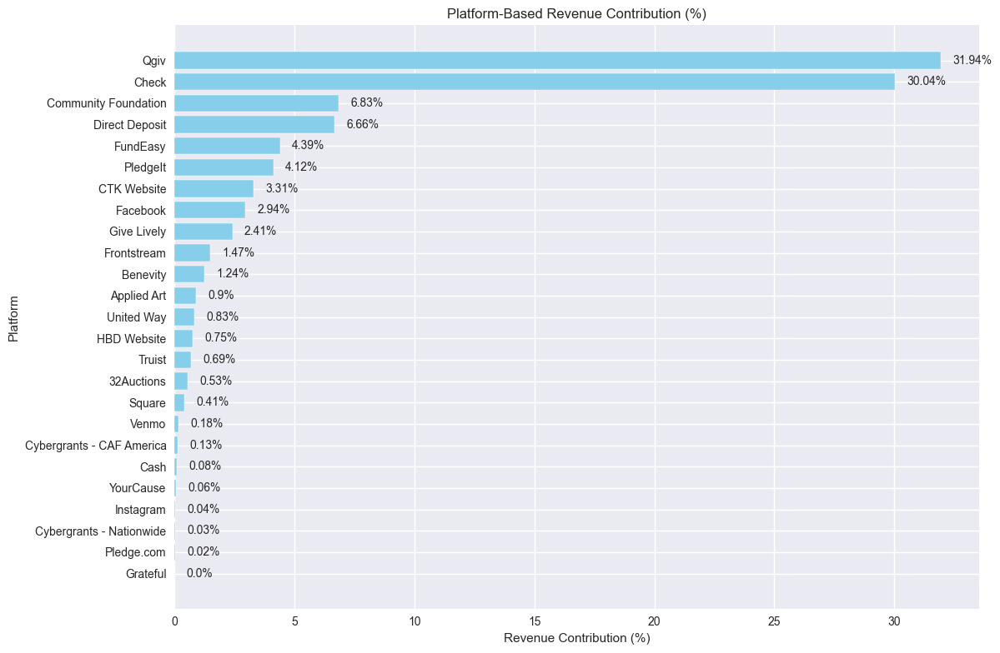

In [56]:

# Plot the percentage contribution graph
plt.figure(figsize=(12, 8))
plt.barh(platform_summary["platform__c"], platform_summary["Revenue_Percentage"], color="skyblue")
plt.xlabel("Revenue Contribution (%)")
plt.ylabel("Platform")
plt.title("Platform-Based Revenue Contribution (%)")
plt.tight_layout()

# Add percentage labels to the bars
for index, value in enumerate(platform_summary["Revenue_Percentage"]):
    plt.text(value + 0.5, index, f"{value}%", va="center", fontsize=10)

# Show the plot
plt.show()

In [57]:
import plotly.express as px
import pandas as pd

# Highlight the top 5 platforms
platform_summary['Highlight'] = platform_summary['Revenue_Percentage'].rank(ascending=False) <= 5

# Create the bar chart
fig = px.bar(
    platform_summary,
    x="Revenue_Percentage",
    y="platform__c",
    color="Highlight",
    color_discrete_map={True: "gold", False: "skyblue"},
    orientation="h",
    title="Platform-Based Revenue Contribution (%)",
    labels={"Revenue_Percentage": "Revenue Contribution (%)", "platform__c": "Platform"},
    text="Revenue_Percentage"  # 👈 Barların üstüne metin eklendi
)

# Update layout and trace for better visualization
fig.update_traces(
    texttemplate='%{text:.2f}%',  # 👈 Yüzdeleri %.2f formatında göster
    textposition='outside'        # 👈 Metni barın dışında göster
)

fig.update_layout(
    xaxis_title="Revenue Contribution (%)",
    yaxis_title="Platform",
    showlegend=False,
    height=600
)

# Show the plot
fig.write_image("platform_revenue.png", width=1200, height=800)
fig.show()


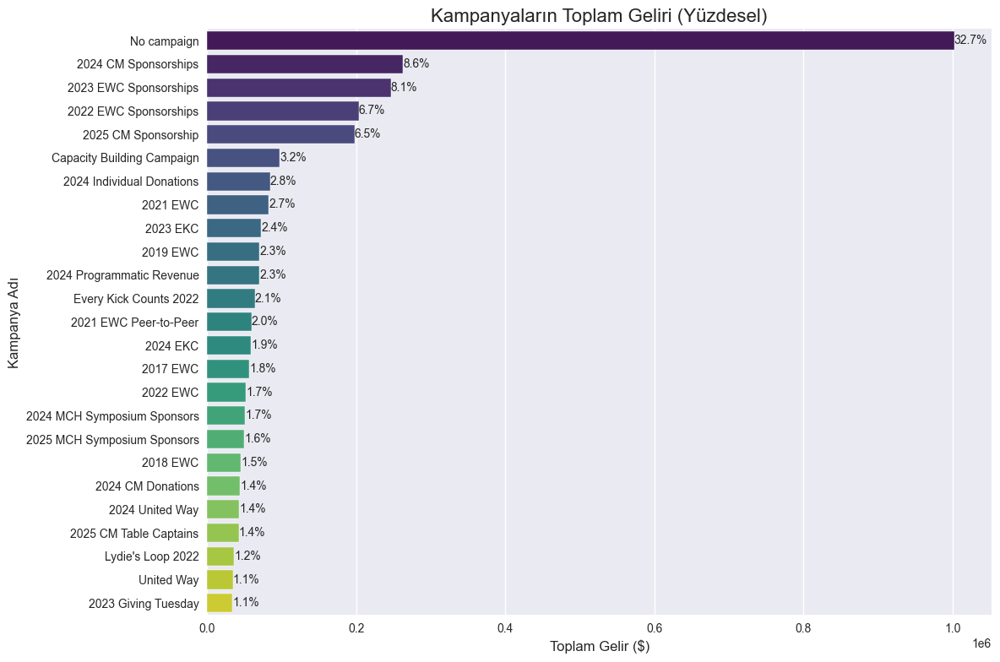

In [58]:
# Kampanyaların toplam gelirini hesapla
campaign_revenue = df.groupby('campaign.name')['amount'].sum().sort_values(ascending=False)
campaign_revenue = campaign_revenue.head(25)

# Yüzdesel değerleri hesapla
total_revenue = campaign_revenue.sum()
campaign_revenue_percentage = (campaign_revenue / total_revenue) * 100

# Grafik oluştur
plt.figure(figsize=(12, 8))
sns.barplot(x=campaign_revenue.values, y=campaign_revenue.index, palette='viridis')

# Barların üzerine yüzdesel değerleri ekle
for i, value in enumerate(campaign_revenue):
    plt.text(value, i, f"{campaign_revenue_percentage[i]:.1f}%", va='center', ha='left', fontsize=10)

plt.title('Kampanyaların Toplam Geliri (Yüzdesel)', fontsize=16)
plt.xlabel('Toplam Gelir ($)', fontsize=12)
plt.ylabel('Kampanya Adı', fontsize=12)
plt.tight_layout()
plt.savefig("campaign_bar_percente.png", dpi=300)
plt.show()

In [59]:
campaign_revenue = pd.DataFrame(campaign_revenue).reset_index()

In [60]:
campaign_revenue['campaign.name'] = campaign_revenue['campaign.name'].apply(lambda x: x.strip().lower())

In [61]:
campaign_revenue.head()

,campaign.name,amount
0,no campaign,1002021.22
1,2024 cm sponsorships,262955.00
2,2023 ewc sponsorships,246517.18
3,2022 ewc sponsorships,203515.95
4,2025 cm sponsorship,197622.80


In [62]:
campaign_revenue["campaign"] = campaign_revenue["campaign.name"].apply(lambda x: "No campaign" if x == "no campaign" else "Other Campaigns")

In [63]:
campaign_revenue.head()

,campaign.name,amount,campaign
0,no campaign,1002021.22,No campaign
1,2024 cm sponsorships,262955.00,Other Campaigns
2,2023 ewc sponsorships,246517.18,Other Campaigns
3,2022 ewc sponsorships,203515.95,Other Campaigns
4,2025 cm sponsorship,197622.80,Other Campaigns


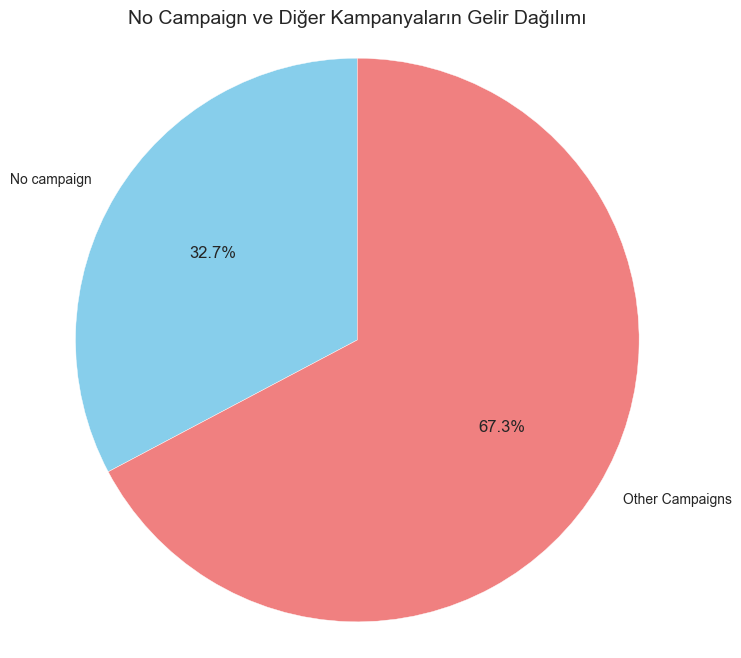

In [64]:

# Gruplara göre toplam gelir
pie_data = campaign_revenue.groupby("campaign")["amount"].sum()

# Pasta grafiği
plt.figure(figsize=(8, 8))
plt.pie(
    pie_data,
    labels=pie_data.index,
    autopct='%1.1f%%',
    startangle=90,
    colors=['skyblue', 'lightcoral']
)
plt.title("No Campaign ve Diğer Kampanyaların Gelir Dağılımı", fontsize=14)
plt.axis('equal')
plt.savefig("campaign_pie.png", dpi=300)
plt.show()

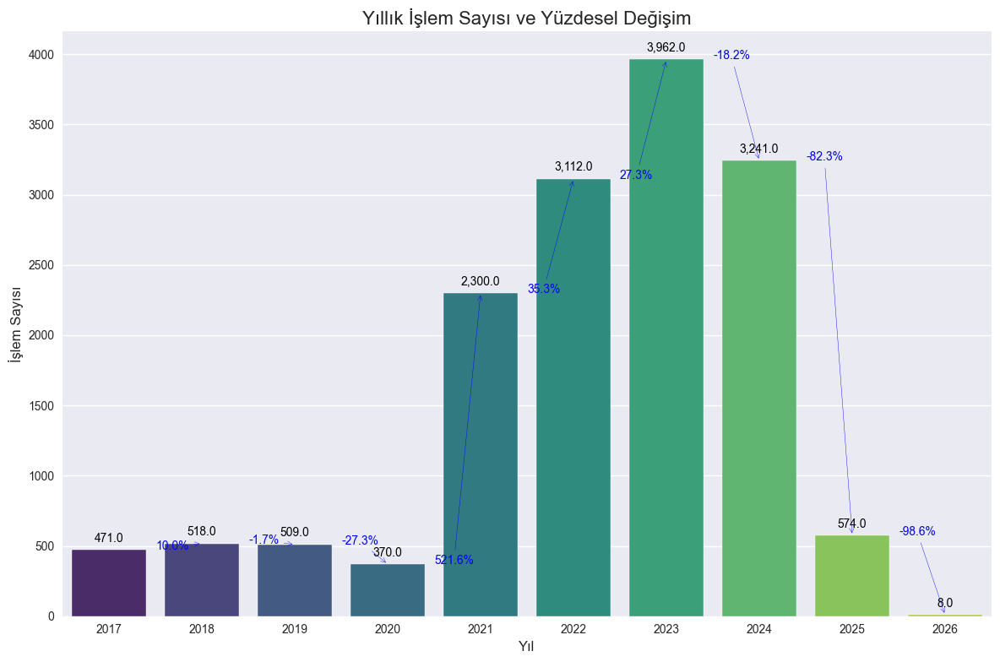

In [67]:
# Yıllık işlem sayısını hesapla
df['year'] = df['closedate'].dt.year
annual_transactions = df.groupby('year')['amount'].count().reset_index()
annual_transactions.rename(columns={'amount': 'transaction_count'}, inplace=True)

# Yıllar arasındaki değişim yüzdesini hesapla
annual_transactions['percentage_change'] = annual_transactions['transaction_count'].pct_change() * 100

# Grafik oluştur
plt.figure(figsize=(12, 8))
sns.barplot(x=annual_transactions['year'], y=annual_transactions['transaction_count'], palette='viridis')

# Barların üzerine işlem adedi ekle
for i, row in annual_transactions.iterrows():
    plt.text(i, row['transaction_count'] + max(annual_transactions['transaction_count']) * 0.01,
             f"{row['transaction_count']:,}", ha='center', va='bottom', fontsize=10, color='black')

# Yüzdesel değişimi oklarla göster
for i in range(1, len(annual_transactions)):
    prev_value = annual_transactions.loc[i - 1, 'transaction_count']
    curr_value = annual_transactions.loc[i, 'transaction_count']
    percentage_change = annual_transactions.loc[i, 'percentage_change']
    
    # Ok çizimi
    plt.annotate(f"{percentage_change:.1f}%",
                 xy=(i, curr_value),
                 xytext=(i - 0.5, prev_value),
                 arrowprops=dict(arrowstyle="->", color="blue"),
                 fontsize=10, color="blue")

plt.title('Yıllık İşlem Sayısı ve Yüzdesel Değişim', fontsize=16)
plt.xlabel('Yıl', fontsize=12)
plt.ylabel('İşlem Sayısı', fontsize=12)
plt.tight_layout()
plt.show()

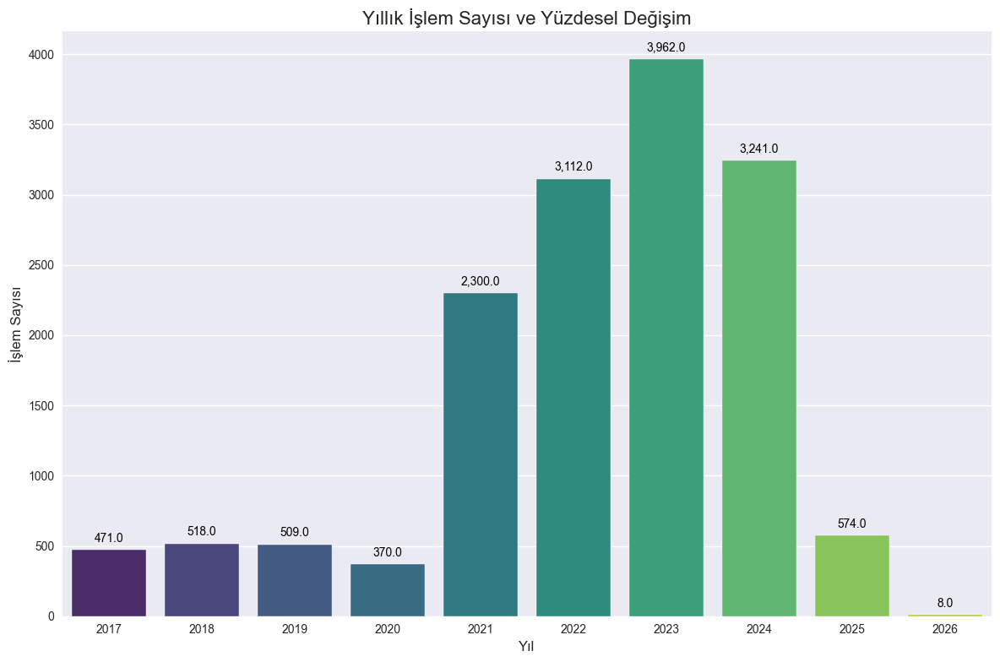

In [69]:
# Yıllık işlem sayısını hesapla
df['year'] = df['closedate'].dt.year
annual_transactions = df.groupby('year')['amount'].count().reset_index()
annual_transactions.rename(columns={'amount': 'transaction_count'}, inplace=True)

# Yıllar arasındaki değişim yüzdesini hesapla
annual_transactions['percentage_change'] = annual_transactions['transaction_count'].pct_change() * 100

# Grafik oluştur
plt.figure(figsize=(12, 8))
sns.barplot(x=annual_transactions['year'], y=annual_transactions['transaction_count'], palette='viridis')

# Barların üzerine işlem adedi ekle
for i, row in annual_transactions.iterrows():
    plt.text(i, row['transaction_count'] + max(annual_transactions['transaction_count']) * 0.01,
             f"{row['transaction_count']:,}", ha='center', va='bottom', fontsize=10, color='black')


plt.title('Yıllık İşlem Sayısı ve Yüzdesel Değişim', fontsize=16)
plt.xlabel('Yıl', fontsize=12)
plt.ylabel('İşlem Sayısı', fontsize=12)
plt.tight_layout()
plt.savefig("yearly_count_transaction.png", dpi=300)
plt.show()

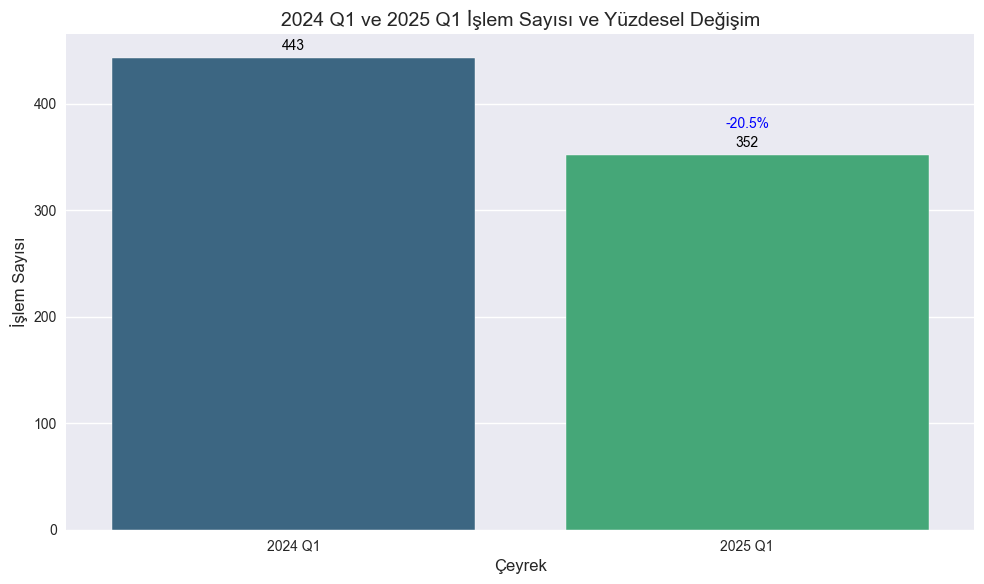

In [72]:
# Çeyrek bilgisi ekle
df['quarter'] = df['closedate'].dt.to_period('Q')

# 2024 ve 2025'in 1. çeyrek verilerini filtrele
q1_2024 = df[df['quarter'] == '2024Q1']
q1_2025 = df[df['quarter'] == '2025Q1']

# İşlem sayısını hesapla
comparison_data = pd.DataFrame({
    'Year': ['2024 Q1', '2025 Q1'],
    'Transaction Count': [q1_2024['amount'].count(), q1_2025['amount'].count()]
})

# Yüzdesel değişimi hesapla
comparison_data['Percentage Change'] = comparison_data['Transaction Count'].pct_change() * 100

# Grafik oluştur
plt.figure(figsize=(10, 6))
bars = sns.barplot(x=comparison_data['Year'], y=comparison_data['Transaction Count'], palette='viridis')

# Barların üzerine işlem adedi ve yüzdesel değişim ekle
for i, row in comparison_data.iterrows():
    plt.text(i, row['Transaction Count'] + max(comparison_data['Transaction Count']) * 0.01,
             f"{row['Transaction Count']:,}", ha='center', va='bottom', fontsize=10, color='black')
    if i > 0:  # Yüzdesel değişim sadece ikinci bar için
        plt.text(i, row['Transaction Count'] + max(comparison_data['Transaction Count']) * 0.05,
                 f"{row['Percentage Change']:.1f}%", ha='center', va='bottom', fontsize=10, color='blue')

# Başlık ve eksen etiketleri
plt.title('2024 Q1 ve 2025 Q1 İşlem Sayısı ve Yüzdesel Değişim', fontsize=14)
plt.xlabel('Çeyrek', fontsize=12)
plt.ylabel('İşlem Sayısı', fontsize=12)
plt.tight_layout()
plt.show()

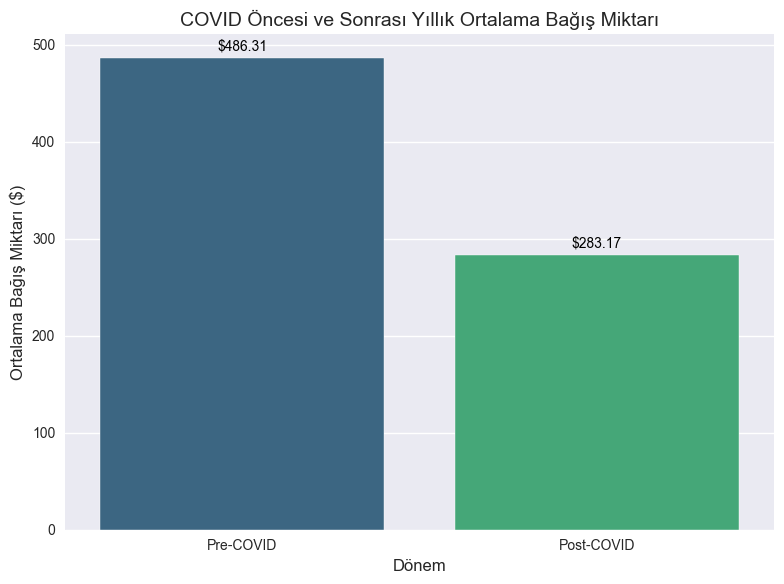

In [73]:
# COVID öncesi ve sonrası yılları belirle
df['year'] = df['closedate'].dt.year
pre_covid_years = df[df['year'] < 2020]
post_covid_years = df[df['year'] >= 2020]

# Yıllık ortalama bağış miktarını hesapla
pre_covid_avg = pre_covid_years.groupby('year')['amount'].mean().mean()
post_covid_avg = post_covid_years.groupby('year')['amount'].mean().mean()

# Veriyi hazırlama
covid_comparison = pd.DataFrame({
    'Period': ['Pre-COVID', 'Post-COVID'],
    'Average Donation': [pre_covid_avg, post_covid_avg]
})

# Grafik oluştur
plt.figure(figsize=(8, 6))
sns.barplot(x='Period', y='Average Donation', data=covid_comparison, palette='viridis')

# Barların üzerine değer ekle
for i, row in covid_comparison.iterrows():
    plt.text(i, row['Average Donation'] + max(covid_comparison['Average Donation']) * 0.01,
             f"${row['Average Donation']:.2f}", ha='center', va='bottom', fontsize=10, color='black')

plt.title('COVID Öncesi ve Sonrası Yıllık Ortalama Bağış Miktarı', fontsize=14)
plt.xlabel('Dönem', fontsize=12)
plt.ylabel('Ortalama Bağış Miktarı ($)', fontsize=12)
plt.tight_layout()
plt.show()

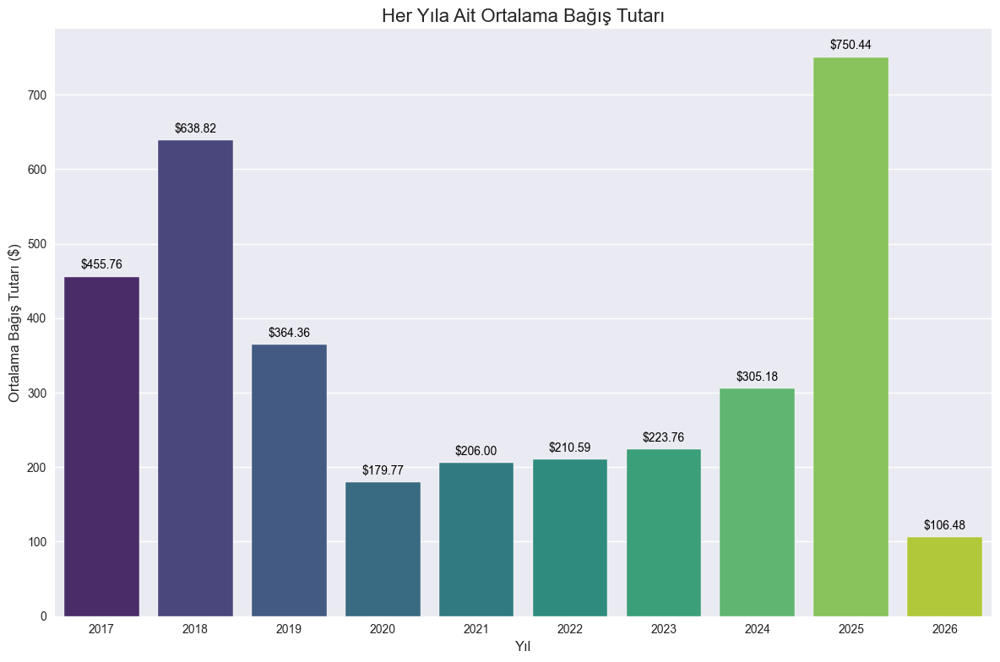

In [74]:
# Yıllık ortalama bağış tutarını hesapla
df['year'] = df['closedate'].dt.year
annual_avg_donation = df.groupby('year')['amount'].mean().reset_index()
annual_avg_donation.rename(columns={'amount': 'average_donation'}, inplace=True)

# Grafik oluştur
plt.figure(figsize=(12, 8))
sns.barplot(x=annual_avg_donation['year'], y=annual_avg_donation['average_donation'], palette='viridis')

# Barların üzerine ortalama bağış tutarını ekle
for i, row in annual_avg_donation.iterrows():
    plt.text(i, row['average_donation'] + max(annual_avg_donation['average_donation']) * 0.01,
             f"${row['average_donation']:.2f}", ha='center', va='bottom', fontsize=10, color='black')

plt.title('Her Yıla Ait Ortalama Bağış Tutarı', fontsize=16)
plt.xlabel('Yıl', fontsize=12)
plt.ylabel('Ortalama Bağış Tutarı ($)', fontsize=12)
plt.tight_layout()
plt.show()

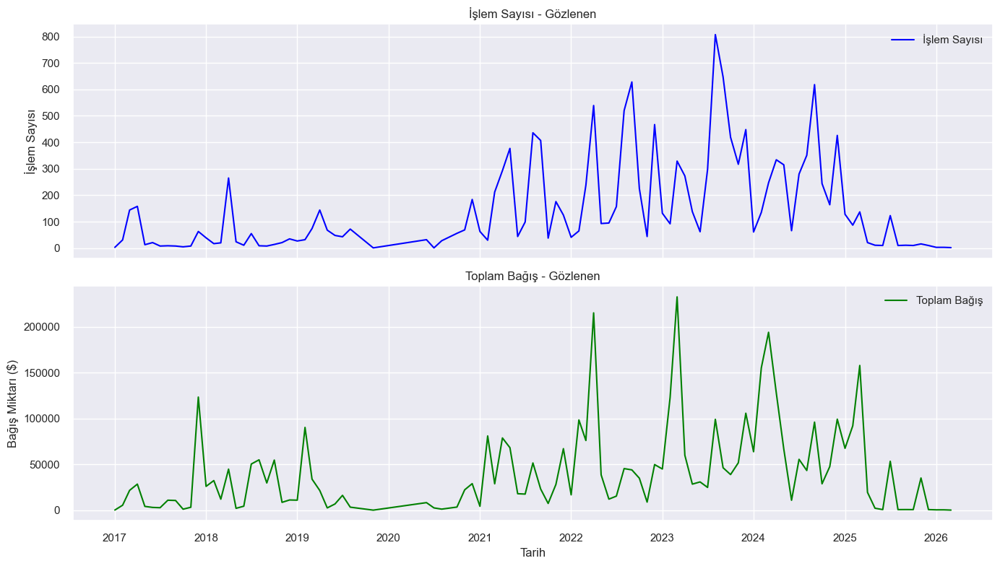

In [89]:
from statsmodels.tsa.seasonal import seasonal_decompose

# 1. Tarih sütununu datetime formatına çevir
df['closedate'] = pd.to_datetime(df['closedate'])

# 2. Aylık bazda year_month sütunu oluştur
df['year_month'] = df['closedate'].dt.to_period('M')

# 3. Aylık işlem sayısı ve toplam bağış miktarı
monthly_stats = df.groupby('year_month')['amount'].agg(
    transaction_count='count',
    total_donation='sum'
).reset_index()

# 4. year_month sütununu zaman serisine uygun hale getir
monthly_stats['year_month'] = monthly_stats['year_month'].dt.to_timestamp()
monthly_stats.set_index('year_month', inplace=True)

# 5. Seasonal decompose işlemi (sadece gözlenen için)
transaction_decompose = seasonal_decompose(monthly_stats['transaction_count'], model='additive', period=12)
donation_decompose = seasonal_decompose(monthly_stats['total_donation'], model='additive', period=12)

# 6. Grafik oluştur - üst üste ve ortak X ekseni ile
fig, axs = plt.subplots(2, 1, figsize=(14, 8), sharex=True)

# Üst grafik: İşlem Sayısı
axs[0].plot(transaction_decompose.observed, label='İşlem Sayısı', color='blue')
axs[0].set_title('İşlem Sayısı - Gözlenen')
axs[0].set_ylabel('İşlem Sayısı')
axs[0].grid(True)
axs[0].legend()

# Alt grafik: Toplam Bağış
axs[1].plot(donation_decompose.observed, label='Toplam Bağış', color='green')
axs[1].set_title('Toplam Bağış - Gözlenen')
axs[1].set_xlabel('Tarih')
axs[1].set_ylabel('Bağış Miktarı ($)')
axs[1].grid(True)
axs[1].legend()

plt.tight_layout()
plt.savefig("yearly_transactionand_donation.png", dpi=300)
plt.show()

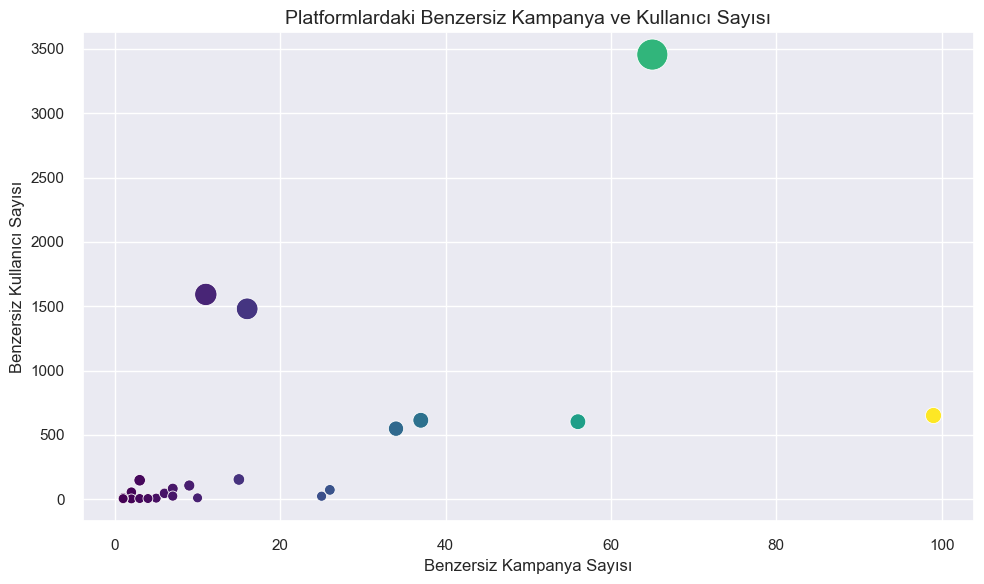

In [90]:
# Platform bazında benzersiz kampanya ve kullanıcı sayısını hesapla
platform_summary = df.groupby('platform__c').agg(
    unique_campaigns=('campaign.name', 'nunique'),
    unique_users=('contactid', 'nunique')
).reset_index()

# Scatter plot oluştur
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=platform_summary,
    x='unique_campaigns',
    y='unique_users',
    size='unique_users',
    hue='unique_campaigns',
    palette='viridis',
    sizes=(50, 500),
    legend=False
)

# Grafik başlık ve etiketleri
plt.title('Platformlardaki Benzersiz Kampanya ve Kullanıcı Sayısı', fontsize=14)
plt.xlabel('Benzersiz Kampanya Sayısı', fontsize=12)
plt.ylabel('Benzersiz Kullanıcı Sayısı', fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()

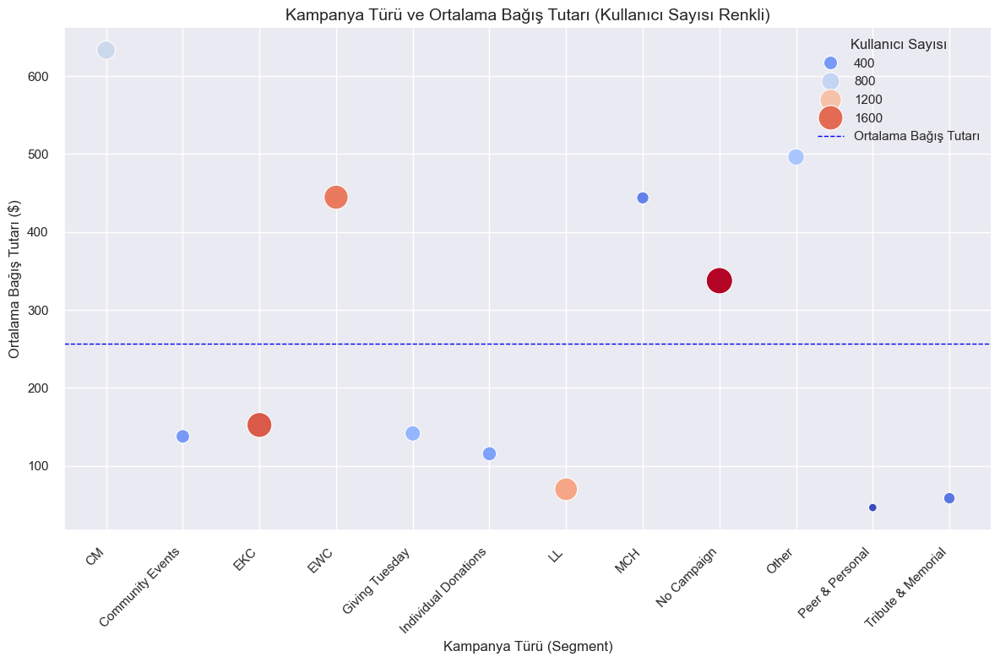

In [95]:


# Kampanya türü bazında ortalama bağış tutarı ve kullanıcı sayısını hesapla
segment_summary = df.groupby('campaign_segment').agg(
    avg_donation=('amount', 'mean'),
    unique_users=('contactid', 'nunique')
).reset_index()

# Scatter plot oluştur
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=segment_summary,
    x='campaign_segment',
    y='avg_donation',
    size='unique_users',
    hue='unique_users',
    palette='coolwarm',
    sizes=(50, 500),
    legend=True
)

# Ortalama bağış tutarına göre kesikli çizgi ekle
avg_donation_mean = segment_summary['avg_donation'].mean()
plt.axhline(y=avg_donation_mean, color='blue', linestyle='--', linewidth=1, label='Ortalama Bağış Tutarı')

# Grafik başlık ve etiketleri
plt.title('Kampanya Türü ve Ortalama Bağış Tutarı (Kullanıcı Sayısı Renkli)', fontsize=14)
plt.xlabel('Kampanya Türü (Segment)', fontsize=12)
plt.ylabel('Ortalama Bağış Tutarı ($)', fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.legend(title='Kullanıcı Sayısı')
plt.tight_layout()
plt.savefig("scatterplot_campaign_segment.png", dpi=300)
plt.show()


In [126]:
# Exclude "No campaign" and calculate the top 10 campaigns with the highest transaction counts
top_10_campaigns = df[df['campaign.name'] != 'No campaign'].groupby('campaign.name').agg(
    Total_Revenue=('amount', 'sum'),
    Transaction_Count=('amount', 'count')
).sort_values(by='Transaction_Count', ascending=False).head(10)
top_10_campaigns.head()


,Total_Revenue,Transaction_Count
campaign.name,,
2023 EKC,72676.70,738
2024 Individual Donations,84183.71,697
Every Kick Counts 2022,64250.91,662
Lydie's Loop 2022,36026.50,551
2024 EKC,58536.89,544


In [129]:

top_10_campaigns = top_10_campaigns.sort_values(by="Total_Revenue", ascending=False)

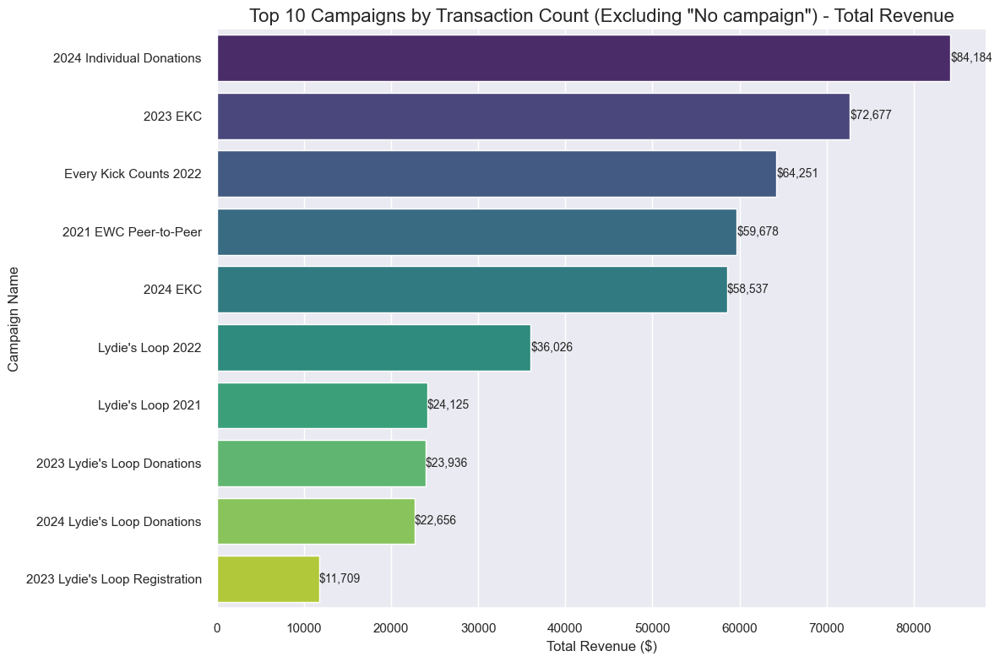

In [130]:
# Plot the total revenue of the top 10 campaigns
plt.figure(figsize=(12, 8))
sns.barplot(
    x=top_10_campaigns['Total_Revenue'],
    y=top_10_campaigns.index,
    palette='viridis'
)

# Add labels to the bars
for i, value in enumerate(top_10_campaigns['Total_Revenue']):
    plt.text(value, i, f"${value:,.0f}", va='center', ha='left', fontsize=10)

# Set titles and labels
plt.title('Top 10 Campaigns by Transaction Count (Excluding "No campaign") - Total Revenue', fontsize=16)
plt.xlabel('Total Revenue ($)', fontsize=12)
plt.ylabel('Campaign Name', fontsize=12)
plt.tight_layout()

# Save and show the plot
plt.savefig("top10_campaign_revenue_excluding_no_campaign.png", dpi=300)
plt.show()

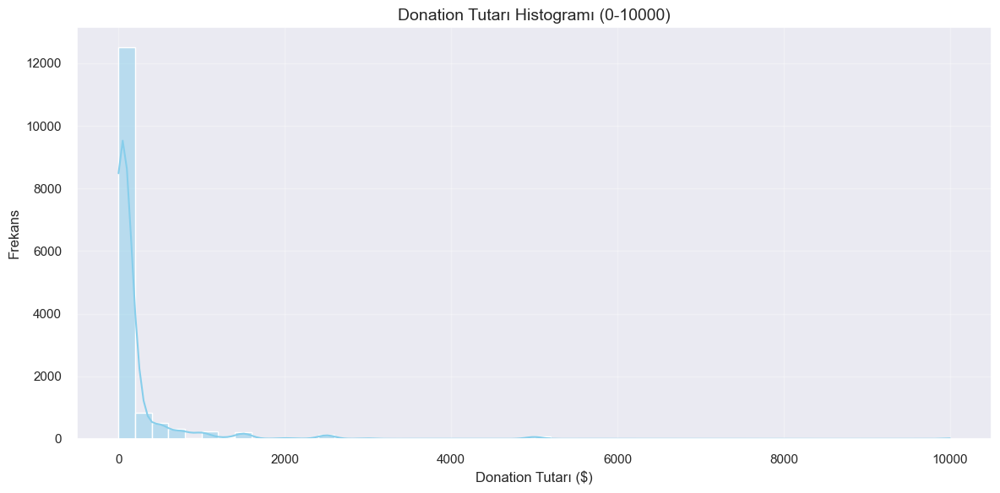

In [131]:

# Donation tutarını filtrele (0 ile 10000 arasında)
filtered_donations = df[(df['amount'] >= 0) & (df['amount'] <= 10000)]

# Histogram oluştur
plt.figure(figsize=(12, 6))
sns.histplot(filtered_donations['amount'], bins=50, kde=True, color='skyblue')

# Başlık ve etiketler
plt.title('Donation Tutarı Histogramı (0-10000)', fontsize=14)
plt.xlabel('Donation Tutarı ($)', fontsize=12)
plt.ylabel('Frekans', fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()

# Grafiği göster
plt.show()

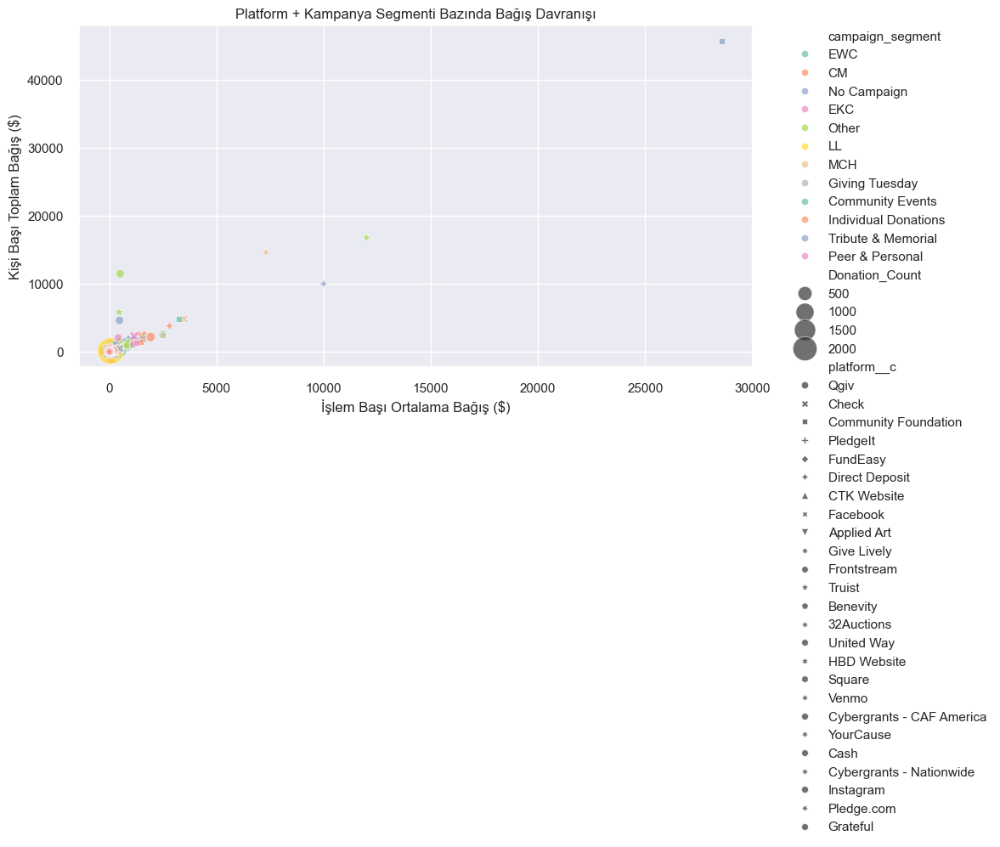

In [132]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=platform_campaign_summary,
    x="Avg_Donation",               # İşlem başına ortalama bağış
    y="Avg_Per_Donor",             # Kişi başına ortalama katkı
    size="Donation_Count",         # İşlem sayısına göre nokta boyutu
    hue="campaign_segment",        # Kampanya segmentine göre renk
    style="platform__c",           # Farklı platformları ayırmak için stil (isteğe bağlı)
    sizes=(50, 500),
    alpha=0.7,
    palette="Set2"
)

plt.title("Platform + Kampanya Segmenti Bazında Bağış Davranışı")
plt.xlabel("İşlem Başı Ortalama Bağış ($)")
plt.ylabel("Kişi Başı Toplam Bağış ($)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


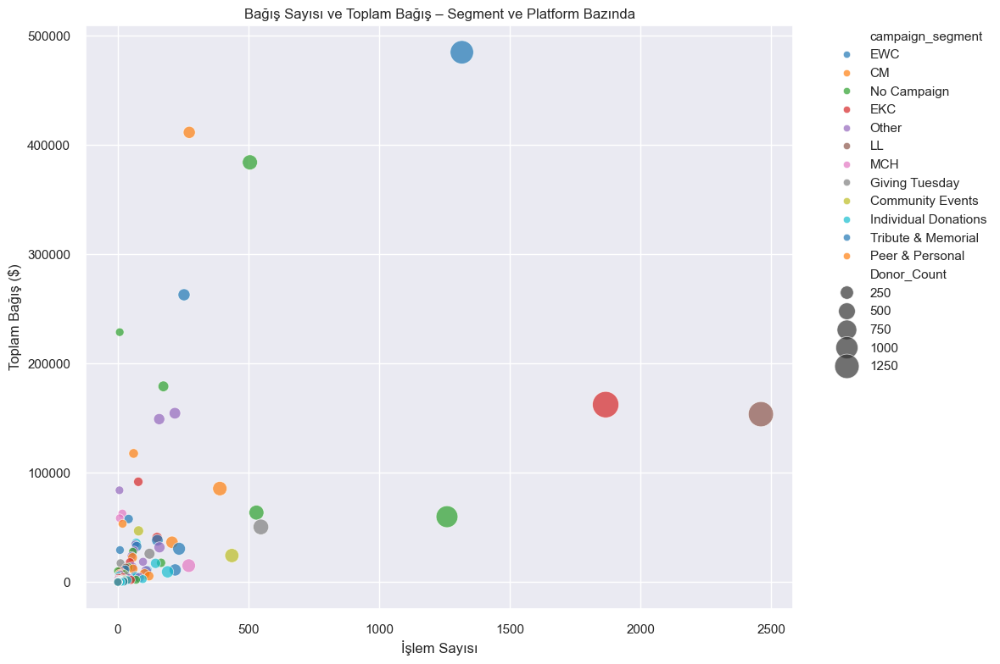

In [133]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=platform_campaign_summary,
    x="Donation_Count",            # Toplam işlem sayısı
    y="Total_Donation",            # Toplam bağış
    hue="campaign_segment",        # Segment rengi
    size="Donor_Count",            # Bağışçı sayısı büyüklük
    sizes=(50, 500),
    alpha=0.7,
    palette="tab10"
)

plt.title("Bağış Sayısı ve Toplam Bağış – Segment ve Platform Bazında")
plt.xlabel("İşlem Sayısı")
plt.ylabel("Toplam Bağış ($)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.show()


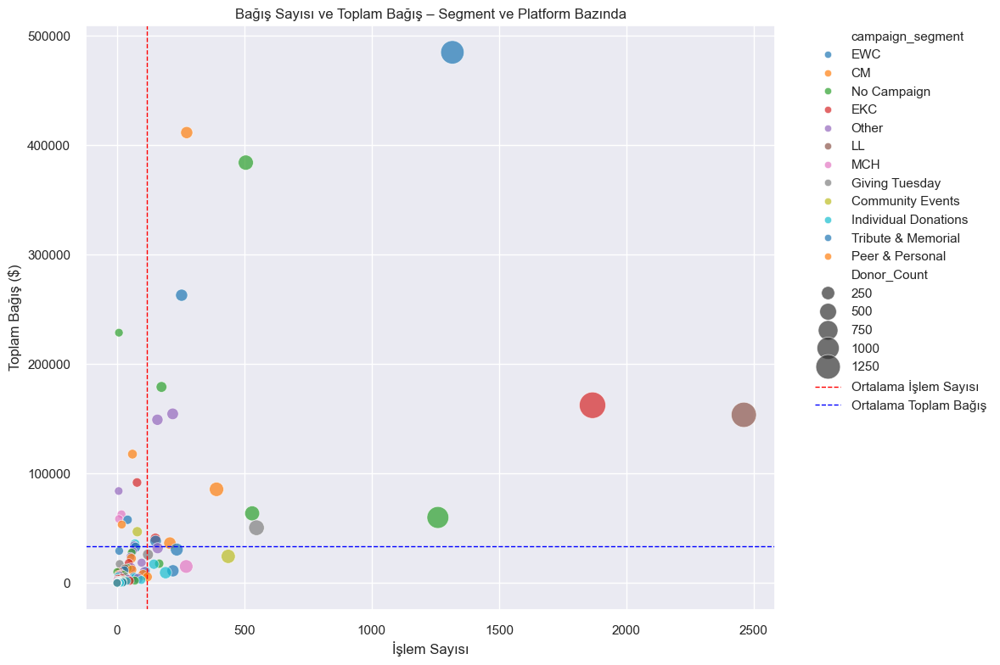

In [137]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=platform_campaign_summary,
    x="Donation_Count",            # Toplam işlem sayısı
    y="Total_Donation",            # Toplam bağış
    hue="campaign_segment",        # Segment rengi
    size="Donor_Count",            # Bağışçı sayısı büyüklük
    sizes=(50, 500),
    alpha=0.7,
    palette="tab10"
)

# Ortalama işlem sayısı ve toplam bağış hesapla
avg_donation_count = platform_campaign_summary["Donation_Count"].mean()
avg_total_donation = platform_campaign_summary["Total_Donation"].mean()

# Ortalama işlem sayısı için kesikli çizgi (kırmızı)
plt.axvline(x=avg_donation_count, color="red", linestyle="--", linewidth=1, label="Ortalama İşlem Sayısı")

# Ortalama toplam bağış için kesikli çizgi (mavi)
plt.axhline(y=avg_total_donation, color="blue", linestyle="--", linewidth=1, label="Ortalama Toplam Bağış")

plt.title("Bağış Sayısı ve Toplam Bağış – Segment ve Platform Bazında")
plt.xlabel("İşlem Sayısı")
plt.ylabel("Toplam Bağış ($)")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.grid(True)
plt.tight_layout()
plt.savefig("scatterplot_avg_donation_count.png", dpi=300)
plt.show()

In [145]:
# Çeyrek bilgisi ekle
df['quarter'] = df['closedate'].dt.to_period('Q')

# Çeyrek bazlı işlem sayısını hesapla
quarterly_transactions = df.groupby('quarter')['amount'].count().reset_index()
quarterly_transactions.rename(columns={'amount': 'transaction_count'}, inplace=True)

# Çeyrek bilgisi sütununun string formatında olduğundan emin olun
quarterly_transactions['quarter'] = quarterly_transactions['quarter'].astype(str)

# Çeyrek bilgisi "Q1" içeren satırları filtrele
q1_transactions = quarterly_transactions[quarterly_transactions["quarter"].str.contains("Q1", case=False)]
print(q1_transactions)

   quarter  transaction_count
0   2017Q1                178
4   2018Q1                 76
8   2019Q1                133
15  2021Q1                305
19  2022Q1                344
23  2023Q1                553
27  2024Q1                443
31  2025Q1                352
35  2026Q1                  8


In [ ]:
# Grafik oluştur
plt.figure(figsize=(12, 8))
sns.barplot(x=quarterly_transactions['quarter'], y=quarterly_transactions['transaction_count'], palette='viridis')

# Barların üzerine işlem adedi ekle
for i, row in quarterly_transactions.iterrows():
    plt.text(i, row['transaction_count'] + max(quarterly_transactions['transaction_count']) * 0.01,
             f"{row['transaction_count']:,}", ha='center', va='bottom', fontsize=10, color='black')

# Başlık ve eksen etiketleri
plt.title('Yıl Çeyrek Bazlı İşlem Sayıları', fontsize=16)
plt.xlabel('Çeyrek', fontsize=12)
plt.ylabel('İşlem Sayısı', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()